## Plots of all clumps

In [26]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
import warnings
warnings.filterwarnings('ignore')

%matplotlib notebook
import matplotlib.pylab as plt
from matplotlib.patches import Ellipse

import pandas as pd

import seaborn as sns
sns.set(style="whitegrid")
from astroML.plotting import setup_text_plots
setup_text_plots(fontsize=8, usetex=False)

import numpy as np

from astropy.io import fits
from astropy import units as u
from astropy.table import Table,Column

**Import data**

In [2]:
# To keep an eye on units
as1063_astropy = Table.read('as1063_clump_properties.fits')
a521_astropy = Table.read('a521_clump_properties.fits')
m1206_astropy = Table.read('snake_clump_properties.fits')

as1063 = as1063_astropy.to_pandas()
a521 = a521_astropy.to_pandas()
m1206 = m1206_astropy.to_pandas()

**Massage data a little bit**

There is a hard clump to deal with in A521 that crosses the critical line. 

In [3]:
a521.ix[15,'mlt_region']= 2

add new column with sizes in pc

In [4]:
as1063['radius_pc'] = as1063['radius_kpc']*1000
a521['radius_pc'] = a521['radius_kpc']*1000
m1206['radius_pc'] = m1206['radius_kpc']*1000

as1063['radius_pc_uerr'] = as1063['radius_kpc_uerr']*1000
a521['radius_pc_uerr'] = a521['radius_kpc_uerr']*1000
m1206['radius_pc_uerr'] = m1206['radius_kpc_uerr']*1000

as1063['radius_pc_lerr'] = as1063['radius_kpc_lerr']*1000
a521['radius_pc_lerr'] = a521['radius_kpc_lerr']*1000
m1206['radius_pc_lerr'] = m1206['radius_kpc_lerr']*1000

Add L_CO10

In [5]:
as1063['Ll_CO10'] = as1063['Ll_CO43']/0.33
a521['Ll_CO10']   = a521['Ll_CO43']/0.33
m1206['Ll_CO10']  = m1206['Ll_CO43']/0.33

Put all the tables together

In [6]:
as1063['mlt_region'] = 1

# region names
#['A','AS-C','AS-E','AS-W','M-S','M-C','M-N']
as1063['region'] = 'AS'
a521['region'] = 'A-C'
a521.ix[a521.mlt_region==2,'region'] = 'A-E'
a521.ix[a521.mlt_region==3,'region'] = 'A-W'
m1206['region'] = 'M-S'
m1206.ix[m1206.mlt_region==2,'region'] = 'M-C'
m1206.ix[m1206.mlt_region==3,'region'] = 'M-N'

all_data = pd.concat([as1063,a521,m1206],keys=['as1063','a521','m1206'],names=['gal','id'])

In [19]:
all_data

L_CO43   L_CO43_lerr   L_CO43_uerr       Ll_CO43  \
gal    id                                                           
as1063 0   1.164556e+05  4.743685e+04  4.614633e+04  8.881895e+06   
       1   7.426022e+05  2.116513e+05  2.281125e+05  5.663718e+07   
       2   9.709879e+04  2.180178e+04  1.681002e+03  7.405582e+06   
       3   2.100900e+05  1.072923e+05  6.579768e+04  1.602325e+07   
       4   2.846623e+05  4.103886e+04  3.807911e+03  2.171078e+07   
       5   4.209416e+04  4.255765e+04  1.888724e+04  3.210460e+06   
       6   1.384407e+05  3.476475e+04  1.308024e+03  1.055867e+07   
a521   0   1.251889e+05  1.346702e+05  1.774129e+05  4.681583e+06   
       1   7.719673e+05  3.041205e+05  7.588093e+04  2.886861e+07   
       2   3.373223e+05  3.631330e+05  2.474007e+05  1.261456e+07   
       3   7.238844e+04  7.748633e+04  1.528286e+05  2.707049e+06   
       4   8.036687e+05  6.234640e+04  6.234640e+04  3.005412e+07   
       5   1.642088e+05  9.308079e+04  2.666315e+05  6.140777e+06   
       6   1.823415e+04  3.313753e+04  3.313753e+04  6.818872e+05   
       7   2.466956e+05  2.522000e+05  2.522000e+05  9.225466e+06   
       8   7.012486e+06  2.572573e+06  1.213909e+06  2.622400e+08   
       9   9.456530e+05  4.271768e+05  6.719851e+04  3.536378e+07   
       10  1.018678e+06  8.117648e+04  8.117648e+04  3.809465e+07   
       11  1.159420e+04  4.365606e+04  3.989971e+04  4.335784e+05   
       12  5.966864e+03  1.664297e+04  1.067610e+04  2.231378e+05   
       13  6.179952e+05  1.507990e+05  5.436921e+04  2.311064e+07   
       14  4.601852e+03  7.374484e+03  2.772632e+03  1.720916e+05   
       15  1.755301e+05  4.795375e+05  4.928308e+05  6.564149e+06   
       16  1.018217e+06  1.114808e+06  8.882669e+05  3.807741e+07   
       17  1.411213e+06  8.356123e+05  4.973636e+05  5.277394e+07   
       18  1.149981e+06  4.920288e+05  6.950730e+04  4.300485e+07   
       19  9.172540e+05  9.699450e+05  5.269093e+04  3.430177e+07   
m1206  0   7.918257e+04  7.813896e+04  7.117699e+04  3.005035e+06   
       1   1.560254e+05  1.548517e+05  1.163715e+05  5.921275e+06   
       2   2.550350e+04  4.306369e+04  2.871813e+04  9.678758e+05   
       3   1.555672e+05  3.169726e+06  3.135518e+06  5.903885e+06   
       4   6.700660e+05  2.163806e+05  2.163806e+05  2.542948e+07   
       5   2.880304e+04  5.484573e+04  3.727696e+04  1.093096e+06   
       6   2.437408e+06  1.269038e+06  1.022010e+06  9.250137e+07   
       7   2.308202e+04  2.599856e+04  3.497254e+03  8.759790e+05   
       8   6.186013e+04  1.768528e+05  1.745730e+05  2.347636e+06   
       9   2.020717e+05  5.330403e+04  5.330403e+04  7.668763e+06   
       10  8.524794e+04  1.406788e+05  5.817726e+04  3.235220e+06   
       11  1.682409e+05  3.831465e+04  3.831465e+04  6.384861e+06   

           Ll_CO43_lerr  Ll_CO43_uerr      Mass_mol  Mass_mol_lerr  \
gal    id                                                            
as1063 0   3.617939e+06  3.519513e+06  1.390959e+08   5.665912e+07   
       1   1.614233e+07  1.739781e+07  8.869726e+08   2.527987e+08   
       2   1.662790e+06  1.282076e+05  1.159759e+08   2.604029e+07   
       3   8.183025e+06  5.018293e+06  2.509339e+08   1.281511e+08   
       4   3.129974e+06  2.904238e+05  3.400040e+08   4.901729e+07   
       5   3.245809e+06  1.440502e+06  5.027775e+07   5.083134e+07   
       6   2.651457e+06  9.976104e+04  1.653552e+08   4.152342e+07   
a521   0   5.036148e+06  6.634559e+06  7.331642e+07   7.886912e+07   
       1   1.137293e+07  2.837655e+06  4.520999e+08   1.781071e+08   
       2   1.357978e+07  9.251833e+06  1.975516e+08   2.126676e+08   
       3   2.897691e+06  5.715202e+06  4.239403e+07   4.537959e+07   
       4   2.331516e+06  2.331516e+06  4.706657e+08   3.651295e+07   
       5   3.480863e+06  9.970991e+06  9.616829e+07   5.451243e+07   
       6   1.239216e+06  1.239216e+06  1.067877e+07   1.940687e+07   
       7   9.431311e+06  9.431311e+06  1.444764e+08   1.477000e+08 

# Mean values of Radius, Mass and linewidth

And some basic tries with hierarchical modelling

In [7]:
import pymc3 as pm

**To be fixed**

In [8]:
data = all_data.dropna(axis=0,subset=['radius_pc'])
data = data.dropna(axis=0,subset=['Mass_mol'])
data = data.dropna(axis=0,subset=['line_width'])

data

L_CO43   L_CO43_lerr   L_CO43_uerr       Ll_CO10  \
gal    id                                                           
as1063 0   1.164556e+05  4.757765e+04  4.628713e+04  2.691483e+07   
       1   7.426022e+05  2.096413e+05  2.261026e+05  1.716278e+08   
       2   9.709879e+04  2.167429e+04  1.553511e+03  2.244116e+07   
       3   2.100900e+05  1.062452e+05  6.475065e+04  4.855531e+07   
       4   2.846623e+05  3.992077e+04  2.689822e+03  6.579024e+07   
       5   4.209416e+04  4.254408e+04  1.887367e+04  9.728668e+06   
       6   1.384407e+05  3.465456e+04  1.197833e+03  3.199597e+07   
a521   0   1.251889e+05  1.334744e+05  1.762171e+05  1.418661e+07   
       1   7.719673e+05  3.206130e+05  9.237344e+04  8.748063e+07   
       2   3.373223e+05  3.586780e+05  2.429457e+05  3.822593e+07   
       3   7.238844e+04  7.693838e+04  1.522807e+05  8.203180e+06   
       4   8.036687e+05  6.172745e+04  6.172745e+04  9.107308e+07   
       5   1.642088e+05  9.060184e+04  2.641525e+05  1.860842e+07   
       6   1.823415e+04  4.827785e+03  4.827785e+03  2.066325e+06   
       7   2.466956e+05  1.647658e+05  1.647658e+05  2.795596e+07   
       8   7.012486e+06  2.577601e+06  1.218937e+06  7.946667e+08   
       9   9.456530e+05  4.281109e+05  6.813269e+04  1.071630e+08   
       10  1.018678e+06  7.907416e+04  7.907416e+04  1.154383e+08   
       11  1.159420e+04  1.672892e+04  1.297257e+04  1.313874e+06   
       12  5.966864e+03  7.016778e+03  1.049914e+03  6.761750e+05   
       13  6.179952e+05  1.478214e+05  5.139156e+04  7.003225e+07   
       14  4.601852e+03  4.942609e+03  3.407567e+02  5.214896e+05   
       15  1.755301e+05  7.895059e+04  9.224385e+04  1.989136e+07   
       16  1.018217e+06  1.090466e+06  8.639245e+05  1.153861e+08   
       17  1.411213e+06  8.368938e+05  4.986451e+05  1.599210e+08   
       18  1.149981e+06  4.958679e+05  7.334638e+04  1.303177e+08   
       19  9.172540e+05  9.741313e+05  5.687729e+04  1.039448e+08   
m1206  0   7.918257e+04  6.815407e+04  6.119210e+04  9.106165e+06   
       1   1.560254e+05  1.499177e+05  1.114376e+05  1.794326e+07   
       2   2.550350e+04  4.399416e+04  2.964859e+04  2.932957e+06   
       3   1.555672e+05  9.525695e+04  6.104883e+04  1.789056e+07   
       4   6.700660e+05  2.237812e+05  2.237812e+05  7.705903e+07   
       5   2.880304e+04  5.580029e+04  3.823152e+04  3.312411e+06   
       6   2.437408e+06  1.320233e+06  1.073205e+06  2.803072e+08   
       8   6.186013e+04  6.789998e+04  6.562016e+04  7.114048e+06   
       9   2.020717e+05  4.308643e+04  4.308643e+04  2.323868e+07   
       10  8.524794e+04  1.379368e+05  5.543523e+04  9.803696e+06   
       11  1.682409e+05  2.368276e+04  2.368276e+04  1.934806e+07   

                Ll_CO43  Ll_CO43_lerr  Ll_CO43_uerr      Mass_mol  \
gal    id                                                           
as1063 0   8.881895e+06  3.628678e+06  3.530251e+06  1.390959e+08   
       1   5.663718e+07  1.598904e+07  1.724451e+07  8.869726e+08   
       2   7.405582e+06  1.653066e+06  1.184840e+05  1.159759e+08   
       3   1.602325e+07  8.103169e+06  4.938438e+06  2.509339e+08   
       4   2.171078e+07  3.044699e+06  2.051488e+05  3.400040e+08   
       5   3.210460e+06  3.244775e+06  1.439468e+06  5.027775e+07   
       6   1.055867e+07  2.643053e+06  9.135701e+04  1.653552e+08   
a521   0   4.681583e+06  4.991429e+06  6.589840e+06  7.331642e+07   
       1   2.886861e+07  1.198969e+07  3.454412e+06  4.520999e+08   
       2   1.261456e+07  1.341318e+07  9.085233e+06  1.975516e+08   
       3   2.707049e+06  2.877200e+06  5.694711e+06  4.239403e+07   
       4   3.005412e+07  2.308369e+06  2.308369e+06  4.706657e+08   
       5   6.140777e+06  3.388160e+06  9.878288e+06  9.616829e+07   
       6   6.818872e+05  1.805406e+05  1.805406e+05  1.067877e+07   
       7   9.225466e+06  6.161609e+06  6.161609e+06  1.444764e+08   
       8   2.622400e+08  9.639236e+07  4.558356e+07  4.106837e+09   
       9   3.5

**No pooling, separate means** 

In [9]:
data.groupby('region').mean()[['Mass_mol','radius_pc','line_width']]

,Mass_mol,radius_pc,line_width
region,,,
A-C,9.692543e+08,594.300910,26.503444
A-E,1.068507e+08,181.152952,25.843408
A-W,9.255270e+07,227.822128,27.074486
AS,2.783736e+08,324.993865,32.066400
M-C,9.245842e+07,174.304663,39.273653
M-N,9.813712e+07,150.073081,53.620339
M-S,7.706792e+08,457.559247,50.267447


Calculate individual means using the fancy pymc3 (just to check the results are the same)

In [10]:
def calculate_individual_means(var,logify=False):
    
    fig, ax = plt.subplots(1,7,figsize=(21,3))
    fig.subplots_adjust(left=0.05,right=0.99)

    indiv_traces = {}

    for i,reg in enumerate(['AS','A-W', 'A-E', 'A-C', 'M-N', 'M-S', 'M-C']):

        print(reg)

        # Select subset of data belonging to each region
        c_data = np.nan
        c_data = data.ix[data.region == reg]
        c_data = c_data.reset_index(drop=True)
        c_values = np.array(c_data[var])
        try:
            c_uncertainty = np.array(np.mean((c_data[var+'_uerr'],c_data[var+'_lerr']),axis=0))
        except KeyError:
            c_uncertainty = np.array(c_data[var+'_unc'])
        c_uncertainty[np.where(c_uncertainty==0)] = np.mean(c_uncertainty)
        if logify:
            c_uncertainty = c_uncertainty/c_values
            c_values = np.log10(c_values)
            
        print(c_values,c_uncertainty)
            

        with pm.Model() as individual_model:

            # Intercept prior
            mu = pm.Normal('mu', mu=np.mean(c_values), sd=c_uncertainty/np.sqrt(len(c_values)))

            # Data likelihood
            obs = pm.Normal('obs', mu=mu, sigma=c_uncertainty, observed=c_values)

            # Inference button (TM)!
            trace = pm.sample(progressbar=False,draws=2000,chains=5,tune=1000)

        indiv_traces[reg] = trace
        mean, std  = trace.get_values('mu').mean(),  trace.get_values('mu').std() 
        print('Results',pm.summary(trace))

        # posterior
        with individual_model:
            post_pred = pm.sample_posterior_predictive(trace, samples=500)

        ax[i].set_title(reg+' '+'(%d)'%mean)
        sns.distplot(post_pred['obs'].mean(axis=1), label='Posterior predictive means', ax=ax[i])
        if len(c_values)>1:
            sns.distplot(c_values,bins=len(c_values),label='data',ax=ax[i])
        ax[i].axvline(np.mean(c_values),lw=2.0, color='r', label='Simple mean')
        ax[i].axvline(mean, ls='--', color='g', label= 'mean')
        ax[i].axvline(mean-std, ls=':', color='g')
        ax[i].axvline(mean+std, ls=':', color='g')

    ax[0].legend()

<IPython.core.display.Javascript object>


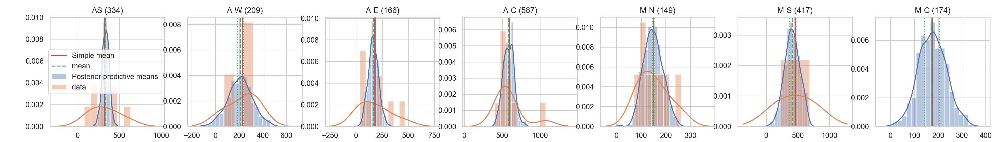

AS
[192.82238037 631.27158477 222.49604738 414.48996536 446.78273498
  78.43564575 288.65869651] [134.28006357 101.67569745  39.8973087  114.65938119  15.84701596
 191.53109682  38.59545683]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
 54%|█████▍    | 271/500 [00:00<00:00, 2706.54it/s]

Results           mean       sd  mc_error     hpd_2.5   hpd_97.5        n_eff     Rhat
mu  334.483402  4.69923  0.073524  325.008686  343.57468  3860.678249  1.00033


100%|██████████| 500/500 [00:00<00:00, 2507.70it/s]


A-W
[293.78792105 317.20710784  72.47135373] [ 87.94418436 276.53139761  64.84471889]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
 39%|███▉      | 197/500 [00:00<00:00, 1962.37it/s]

Results          mean         sd  mc_error    hpd_2.5   hpd_97.5        n_eff  \
mu  209.94295  25.903682  0.353793  158.00776  258.94428  4281.767378   

        Rhat  
mu  1.000178  


100%|██████████| 500/500 [00:00<00:00, 1928.77it/s]


A-E
[466.86229178 312.39698832 113.39481819  40.67086085 222.2215819
  41.13426536  39.5912252  212.95158232] [ 58.79943999  57.08743542 393.06799018   5.38413105  74.20993404
  32.23576763  22.88159798  54.74385295]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2752.21it/s]

Results          mean        sd  mc_error     hpd_2.5    hpd_97.5        n_eff  \
mu  166.39883  1.696451  0.023507  163.220122  169.937816  4243.732198   

        Rhat  
mu  1.000216  


A-C
[ 540.36920041 1073.39946929  575.37152858  528.7291178   398.16430434
  634.7998998   605.58446641  495.06422376  497.22597585] [ 20.75209016 179.41237486 129.79224539  20.52110466  41.88706842
 423.34323864 248.26130395 126.02577085 317.6457341 ]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
 31%|███       | 154/500 [00:00<00:00, 1538.31it/s]

Results           mean      sd  mc_error     hpd_2.5    hpd_97.5        n_eff  \
mu  587.154855  4.2297  0.063516  578.774666  595.325313  4046.563968   

        Rhat  
mu  1.000109  


100%|██████████| 500/500 [00:00<00:00, 1720.01it/s]


M-N
[170.62692763 105.76601832 261.90400078  71.51137814 154.70866544
 100.2592698  127.3286063  208.47978057] [ 94.81776747  92.87797275  43.73389148 128.33440387  93.80035656
  10.68881702 188.85647711  14.67353336]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
 52%|█████▏    | 262/500 [00:00<00:00, 2612.89it/s]

Results           mean        sd  mc_error     hpd_2.5    hpd_97.5        n_eff  \
mu  149.207335  2.779107  0.041222  143.850276  154.676448  4480.973117   

        Rhat  
mu  1.000373  


100%|██████████| 500/500 [00:00<00:00, 2449.68it/s]


M-S
[228.82981548 686.28867783] [101.64685384 185.24969759]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2658.05it/s]

Results           mean         sd  mc_error     hpd_2.5    hpd_97.5        n_eff  \
mu  417.314864  52.344414  0.805892  310.302139  514.549765  4211.683694   

        Rhat  
mu  1.001744  


M-C
[174.30466316] [46.64245921]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2721.98it/s]

Results           mean         sd  mc_error     hpd_2.5    hpd_97.5        n_eff  \
mu  174.231919  32.795592  0.482401  107.698694  235.586677  4991.522218   

        Rhat  
mu  1.000455  


In [11]:
calculate_individual_means('radius_pc')

<IPython.core.display.Javascript object>


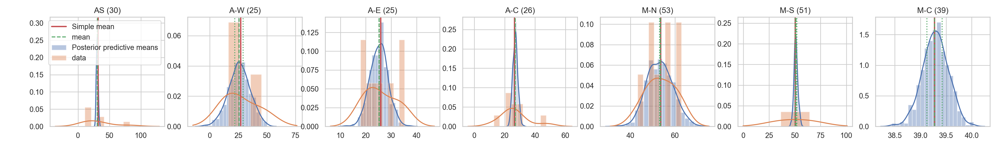

AS
[10.85684805 82.40531568 41.23724112 37.29011266 20.36579374 11.9950627
 20.31442659] [ 0.71497433  2.76027401  0.59377786  0.52339932  0.24158504 10.58537641
  0.07416022]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2607.96it/s]

Results          mean        sd  mc_error   hpd_2.5   hpd_97.5        n_eff      Rhat
mu  30.664455  0.024701  0.000376  30.61822  30.713994  4137.210573  1.000564



Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


A-W
[16.19110809 19.80717253 45.22517611] [11.09099785 10.39317559 23.02390452]


Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|█████████▉| 499/500 [00:00<00:00, 2441.65it/s]

Results          mean        sd  mc_error    hpd_2.5   hpd_97.5        n_eff      Rhat
mu  25.509893  3.608188  0.060234  18.372343  32.507242  4312.278404  1.000218


100%|██████████| 500/500 [00:00<00:00, 2471.42it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


A-E
[29.81229384 22.06741358 24.53205479 24.30513019 17.86251805 35.22895429
 33.51441182 19.42449042] [ 0.48940534 11.91097563  0.687527    5.98043359  5.98043359 17.73472644
 16.88356203  0.13727228]


Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2664.31it/s]

Results          mean        sd  mc_error    hpd_2.5   hpd_97.5        n_eff      Rhat
mu  25.232034  0.043207  0.000619  25.149792  25.318631  4403.851687  1.000935



Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


A-C
[22.10269336 47.36325017 29.2924932  22.6062923  23.84916196 12.81610895
 30.82345529 24.90699144 24.77054722] [ 2.68084787  0.47494048  1.94425135  2.68084787  1.48078367  6.7731611
  0.07028472  0.8285049  12.55570465]


Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2786.88it/s]

Results          mean        sd  mc_error    hpd_2.5   hpd_97.5        n_eff      Rhat
mu  26.963045  0.021702  0.000332  26.921237  27.006482  4131.295461  1.000468



Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


M-N
[49.62735968 48.88862081 56.61044443 43.19783122 50.85941331 62.82441322
 56.05379625 60.90083269] [14.18269239 25.45080411 11.29106703 21.72726388  0.85464467 11.29106703
 28.11313124 11.29106703]


Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2680.94it/s]

Results          mean        sd  mc_error    hpd_2.5   hpd_97.5        n_eff      Rhat
mu  53.324321  0.276707   0.00429  52.761738  53.861698  4076.311253  1.000194



Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


M-S
[36.25919948 64.27569363] [2.44862249 2.02282894]


Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2708.10it/s]

Results          mean        sd  mc_error    hpd_2.5   hpd_97.5        n_eff     Rhat
mu  51.141341  0.904987  0.013115  49.334163  52.833721  4625.543062  1.00001



Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


M-C
[39.27365343] [0.2120801]


Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2871.02it/s]

Results          mean        sd  mc_error    hpd_2.5   hpd_97.5        n_eff      Rhat
mu  39.274658  0.149877  0.002253  38.971575  39.558462  4495.458428  1.000073


In [12]:
calculate_individual_means('line_width')

<IPython.core.display.Javascript object>


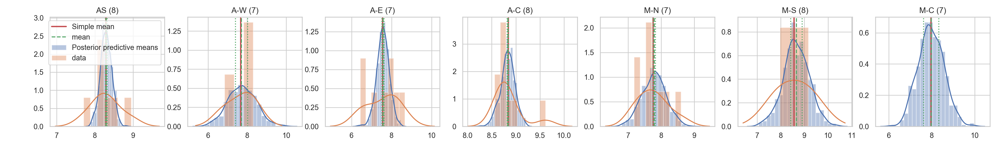

AS
[8.14331421 8.94791021 8.06436777 8.39955927 8.53148398 7.70137587
 8.21841785] [0.40300684 0.29338984 0.1196091  0.40695876 0.0748441  0.72952814
 0.12948644]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2555.44it/s]

Results         mean        sd  mc_error   hpd_2.5  hpd_97.5        n_eff      Rhat
mu  8.297948  0.019303  0.000342  8.261488  8.336635  3844.154325  1.001588


A-W
[7.86520127 8.29568051 6.8318762 ] [1.23689676 0.89176396 1.2808776 ]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
 34%|███▍      | 171/500 [00:00<00:00, 1706.54it/s]

Results         mean        sd  mc_error   hpd_2.5  hpd_97.5        n_eff      Rhat
mu  7.704952  0.312265  0.005045  7.101857  8.323318  4018.253407  1.000058


100%|██████████| 500/500 [00:00<00:00, 1970.59it/s]


A-E
[8.6552344  7.62730474 7.9830319  7.02852113 8.15979686 6.54338163
 6.43056813 8.011987  ] [0.26748957 1.58325707 1.08019297 0.26476602 0.66789133 0.67595739
 0.57404774 0.48764992]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2855.84it/s]

Results         mean        sd  mc_error   hpd_2.5  hpd_97.5        n_eff      Rhat
mu  7.570867  0.052553  0.000801  7.466434  7.668502  3977.612503  1.000153


A-C
[8.67271255 9.6135075  8.74336729 8.77567255 8.55862058 8.77547597
 8.91722808 8.82832604 8.73012513] [0.07680708 0.27069844 0.26238148 0.07762427 0.16117678 0.95971184
 0.47318825 0.24748862 0.56200821]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
 39%|███▉      | 195/500 [00:00<00:00, 1946.09it/s]

Results         mean        sd  mc_error   hpd_2.5  hpd_97.5        n_eff      Rhat
mu  8.835641  0.015166  0.000233  8.805606  8.864452  4006.417404  1.000074


100%|██████████| 500/500 [00:00<00:00, 1981.52it/s]


M-N
[7.67265803 7.18062819 8.60014605 7.23346675 7.56543932 8.07953387
 7.70471235 7.99996   ] [0.81675915 1.44377757 0.33396887 1.6323244  1.07920986 0.21322352
 1.13417404 0.14076697]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2506.05it/s]

Results         mean        sd  mc_error   hpd_2.5  hpd_97.5        n_eff     Rhat
mu  7.788638  0.035936  0.000537  7.720198  7.861161  4057.725553  1.00026


M-S
[7.96722378 9.16095675] [0.83754081 0.49098006]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2601.74it/s]

Results      mean        sd  mc_error   hpd_2.5  hpd_97.5        n_eff      Rhat
mu  8.663  0.240989  0.003526  8.177936  9.120515  4157.112291  1.000625


M-C
[7.96594646] [0.50237386]


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
The acceptance probability does not match the target. It is 0.8875950109067585, but should be close to 0.8. Try to increase the number of tuning steps.
100%|██████████| 500/500 [00:00<00:00, 3008.39it/s]


Results         mean        sd  mc_error   hpd_2.5  hpd_97.5       n_eff      Rhat
mu  7.970438  0.353123  0.006135  7.284649  8.658856  3726.34699  1.000547


In [13]:
calculate_individual_means('Mass_mol',logify=True)

**Complete Pooling** (all together)

In [14]:
data.mean()[['Mass_mol','radius_pc','line_width']]

Mass_mol      3.742969e+08
radius_pc     3.170096e+02
line_width    3.472994e+01
dtype: float64

In [15]:
def pooling_means(var,logify=False):
    
    c_values = np.array(data[var])
    try:
        c_uncertainty = np.array(np.mean((data[var+'_uerr'],data[var+'_lerr']),axis=0))
    except KeyError:
        c_uncertainty = np.array(data[var+'_unc'])
        c_uncertainty[np.where(c_uncertainty==0)] = np.mean(c_uncertainty)
    if logify:
        c_uncertainty = c_uncertainty/c_values
        c_values = np.log10(c_values)

    with pm.Model() as individual_model:

        # Intercept prior
        mu = pm.Normal('mu', mu=np.mean(c_values), sd=c_uncertainty/len(c_values))

        # Data likelihood
        obs = pm.Normal('obs', mu=mu, sigma=c_uncertainty, observed=c_values)

        # Inference button (TM)!
        trace = pm.sample(progressbar=False,draws=2000,chains=5,tune=1000)


    # posterior
    with individual_model:
        post_pred = pm.sample_posterior_predictive(trace, samples=500)

    fig, ax = plt.subplots()
    sns.distplot(post_pred['obs'].mean(axis=1), label='Posterior predictive means', ax=ax)
    mean, std  = trace.get_values('mu').mean(),  trace.get_values('mu').std() 
    ax.axvline(np.mean(c_values),lw=2.0, color='r', label='Simple mean')
    ax.axvline(mean, ls='--', color='g', label= 'mean')
    ax.axvline(mean-std, ls=':', color='g')
    ax.axvline(mean+std, ls=':', color='g')
    print('Results',pm.summary(trace))
    ax.legend()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2634.81it/s]


<IPython.core.display.Javascript object>


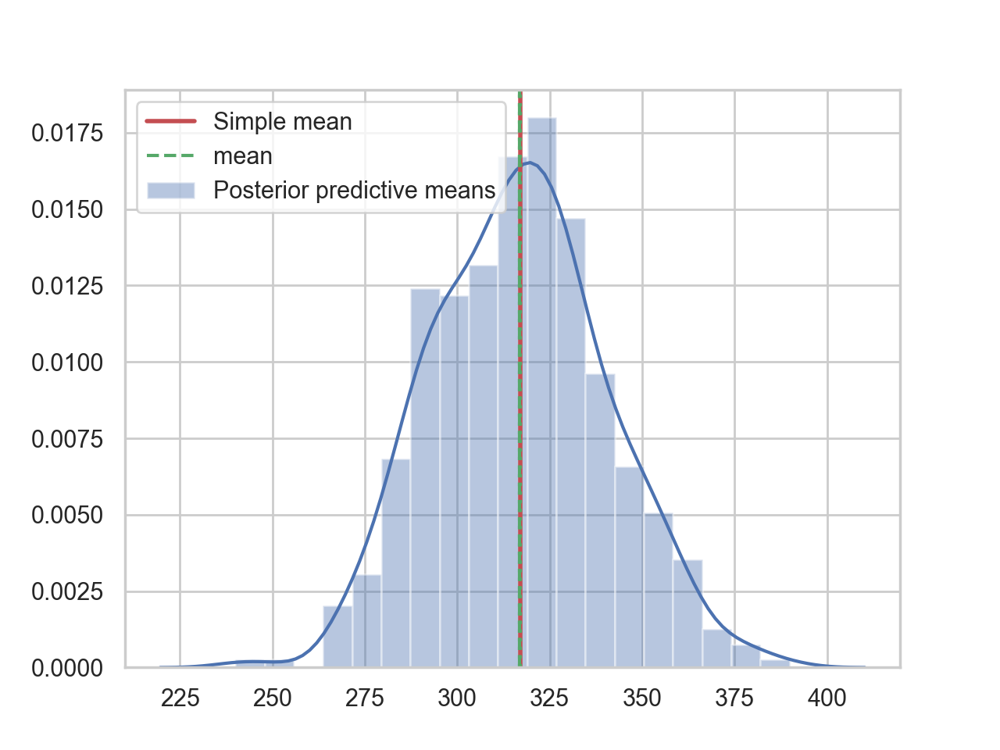

Results           mean        sd  mc_error     hpd_2.5    hpd_97.5        n_eff  \
mu  316.886311  0.104074  0.001343  316.682847  317.087487  4667.088518   

        Rhat  
mu  1.000874  


In [16]:
pooling_means('radius_pc')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2501.71it/s]


<IPython.core.display.Javascript object>


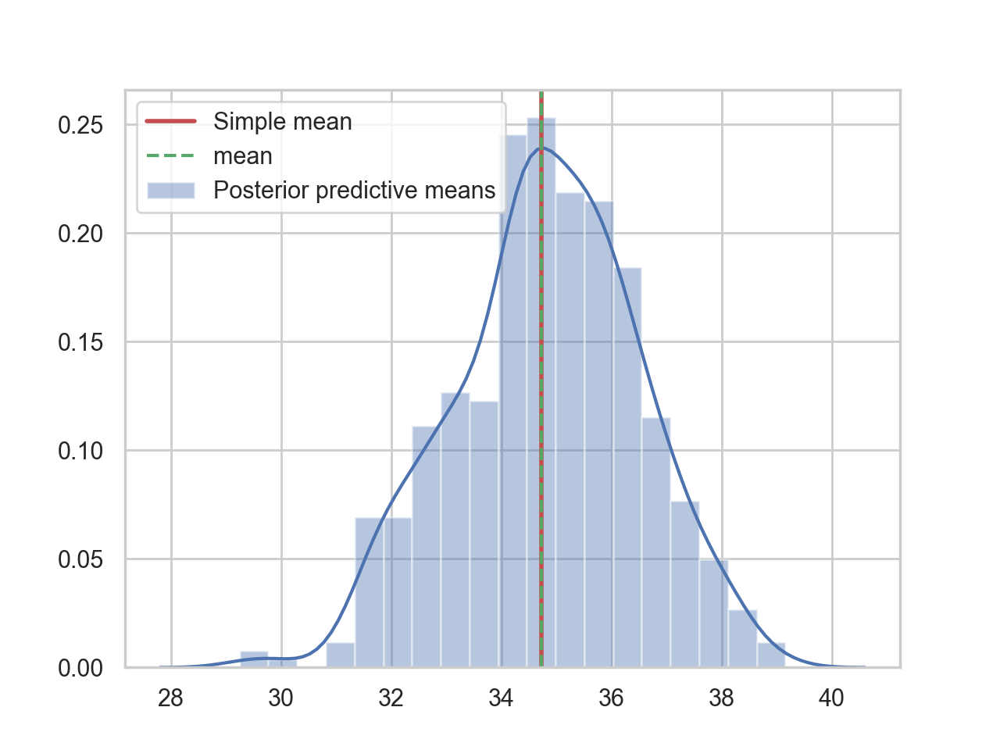

Results          mean        sd  mc_error    hpd_2.5   hpd_97.5        n_eff      Rhat
mu  34.723926  0.001168  0.000017  34.721644  34.726195  4228.889549  1.000127


In [17]:
pooling_means('line_width')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2588.06it/s]


<IPython.core.display.Javascript object>


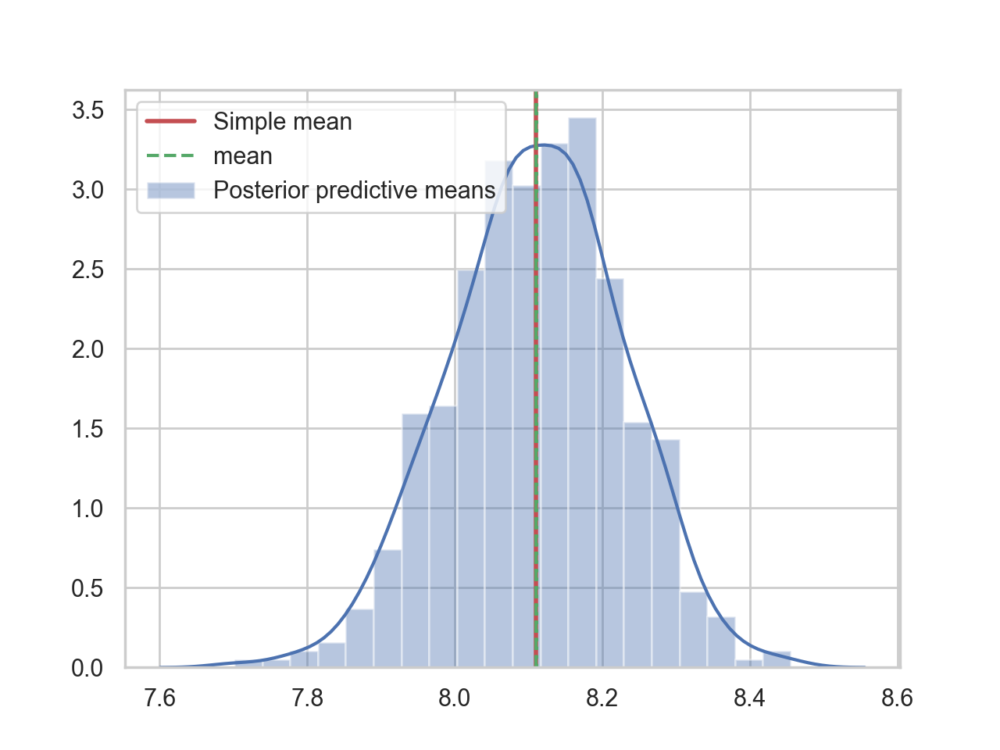

Results         mean        sd  mc_error   hpd_2.5  hpd_97.5        n_eff      Rhat
mu  8.110407  0.000869  0.000013  8.108616  8.112018  4386.886835  1.000082


In [18]:
pooling_means('Mass_mol',logify=True)

**Hierarchical**

In [19]:
reg_idx = data['region'].values
translate = {'AS':0, 'A-W':1 , 'A-E':2 ,'A-C':3, 'M-S':4, 'M-C':5, 'M-N':6 }
reg_id_numerical = [translate[reg] for reg in reg_idx]
print(reg_id_numerical)

[0, 0, 0, 0, 0, 0, 0, 1, 2, 1, 2, 3, 2, 2, 2, 3, 3, 3, 1, 2, 3, 2, 2, 3, 3, 3, 3, 6, 4, 6, 5, 6, 6, 4, 6, 6, 6, 6]


In [20]:
def hierarchical_model(var,logify=False):
    
    c_values = np.array(data[var])
    try:
        c_uncertainty = np.array(np.mean((data[var+'_uerr'],data[var+'_lerr']),axis=0))
    except KeyError:
        c_uncertainty = np.array(data[var+'_unc'])
        c_uncertainty[np.where(c_uncertainty==0)] = np.mean(c_uncertainty)
    if logify:
        c_uncertainty = c_uncertainty/c_values
        c_values = np.log10(c_values)

    with pm.Model() as hierarchical_model:

        # Intercept prior
        mu = pm.Normal('mu', mu=np.mean(c_values), sd=c_uncertainty/np.sqrt(len(c_values)))

        # Data likelihood
        obs = pm.Normal('obs', mu=mu, sigma=c_uncertainty, observed = c_values, shape=len(all_data.region.unique()))


        # Inference button (TM)!
        trace = pm.sample(progressbar=True,draws=2000,chains=5,tune=1000)


    # posterior
    with hierarchical_model:
        post_pred = pm.sample_posterior_predictive(trace, samples=500)

    fig, ax = plt.subplots()
    sns.distplot(post_pred['obs'].mean(axis=1), label='Posterior predictive means', ax=ax)
    mean, std  = trace.get_values('mu').mean(),  trace.get_values('mu').std() 
    ax.axvline(np.mean(c_values),lw=2.0, color='r', label='Simple mean')
    ax.axvline(mean, ls='--', color='g', label= 'mean')
    ax.axvline(mean-std, ls=':', color='g')
    ax.axvline(mean+std, ls=':', color='g')
    print('Results',pm.summary(trace))

    ax.legend()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2445.84it/s]


<IPython.core.display.Javascript object>


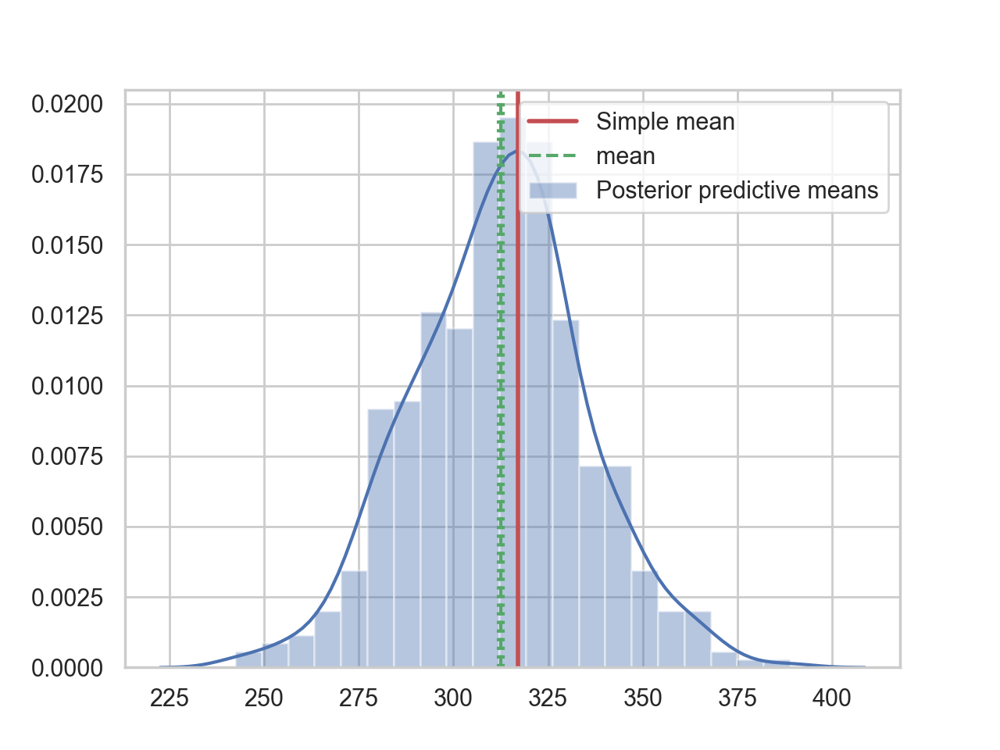

Results           mean        sd  mc_error     hpd_2.5    hpd_97.5        n_eff  \
mu  312.506349  0.639104  0.009401  311.264746  313.754172  4387.300764   

        Rhat  
mu  1.000605  


In [21]:
hierarchical_model('radius_pc')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
Sampling 5 chains: 100%|██████████| 15000/15000 [00:06<00:00, 2192.41draws/s]
The acceptance probability does not match the target. It is 0.8797418658653473, but should be close to 0.8. Try to increase the number of tuning steps.
100%|██████████| 500/500 [00:00<00:00, 1885.32it/s]


<IPython.core.display.Javascript object>


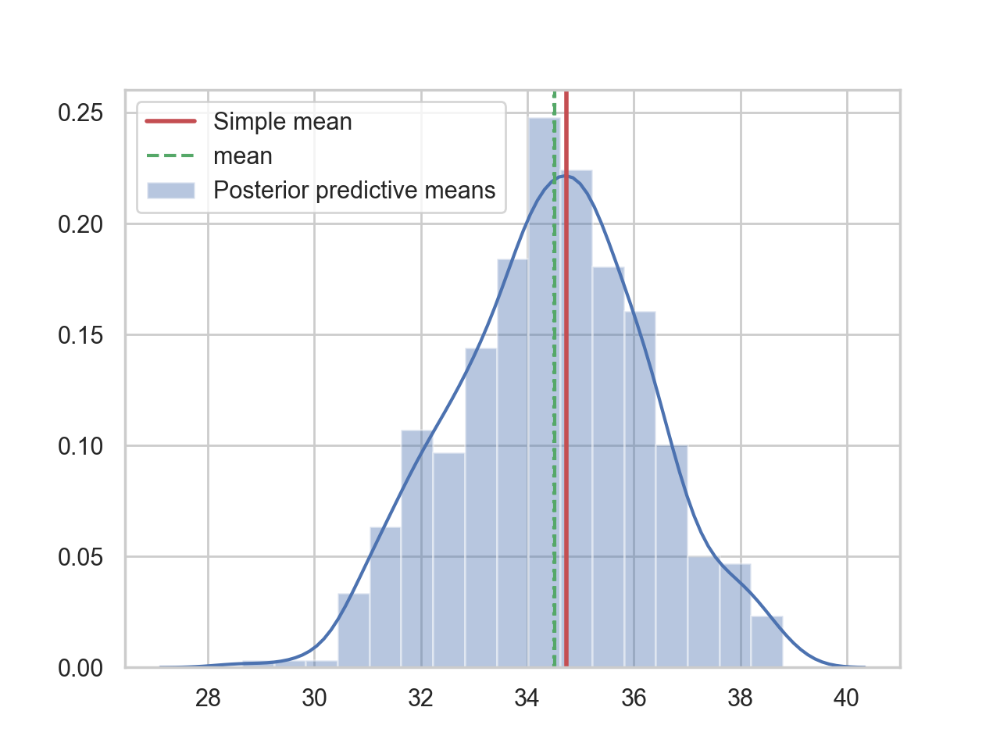

Results          mean        sd  mc_error    hpd_2.5   hpd_97.5        n_eff      Rhat
mu  34.506345  0.007181  0.000113  34.492425  34.520309  4318.658664  1.001313


In [22]:
hierarchical_model('line_width')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [mu]
100%|██████████| 500/500 [00:00<00:00, 2584.90it/s]


<IPython.core.display.Javascript object>


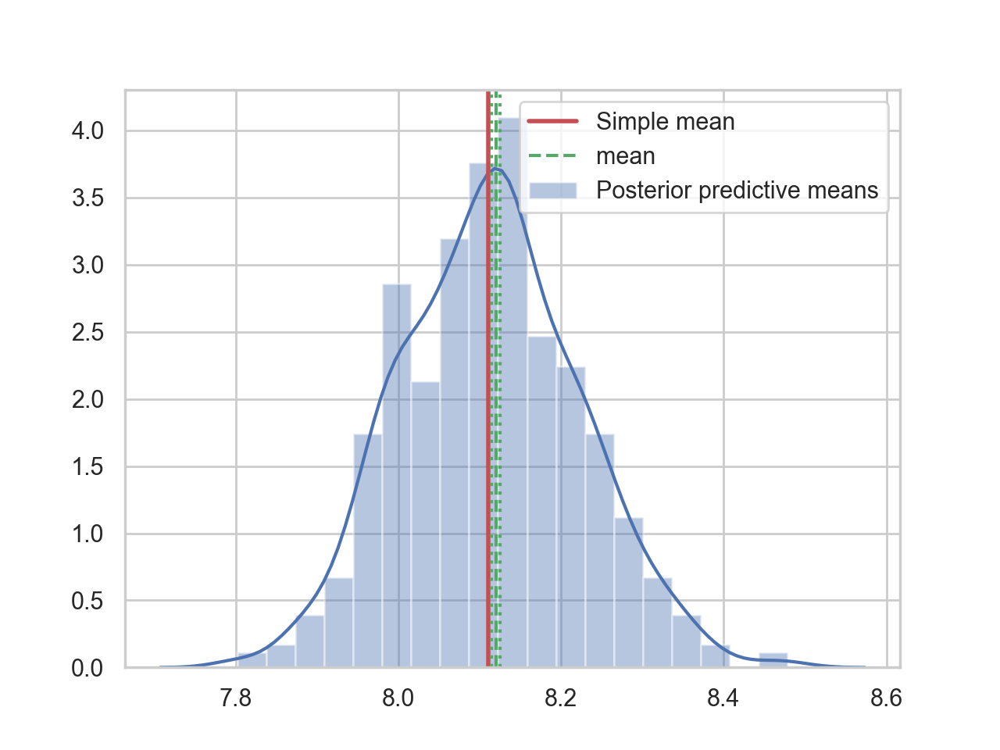

Results         mean       sd  mc_error   hpd_2.5  hpd_97.5        n_eff      Rhat
mu  8.119893  0.00538  0.000086  8.109577  8.130617  4167.484068  1.000675


In [23]:
hierarchical_model('Mass_mol',logify=True)

# Larson relations

<IPython.core.display.Javascript object>


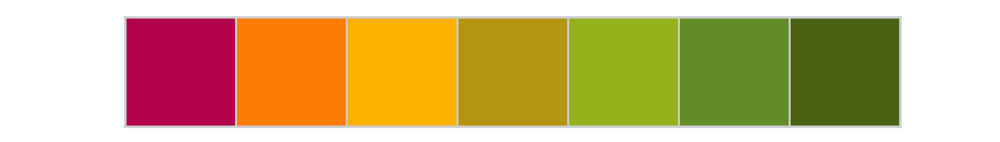

In [24]:
sns.palplot(sns.xkcd_palette(['raspberry','pumpkin orange','yellow orange','dark gold','sickly green','mossy green','camouflage green']))

cmap = sns.xkcd_palette(['raspberry','pumpkin orange','yellow orange','dark gold','sickly green','mossy green','camouflage green'])
names = ['A','AS-C','AS-E','AS-W','M-S','M-C','M-N']

<IPython.core.display.Javascript object>


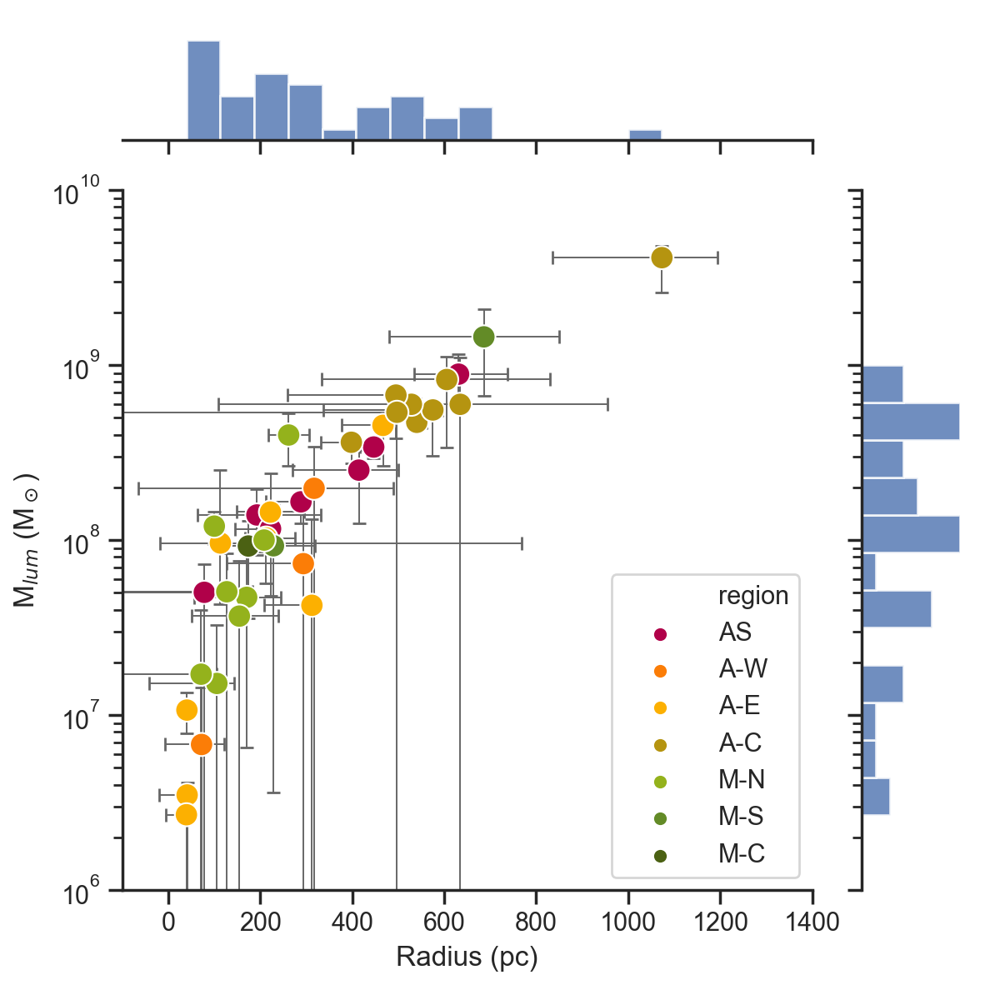

Text(34.875, 0.5, 'M$_{lum}$ (M$_\\odot$)')

In [27]:
sns.set(style="ticks", color_codes=True)

# Global plot
g = sns.JointGrid("radius_pc", "Mass_mol", data=all_data, space=0.5)

## Main plot
g = g.plot_joint(plt.scatter, color="#005f6a")

# per region
sns.scatterplot('radius_pc','Mass_mol',data=all_data, hue='region',
                palette=cmap,zorder=10,s=100, ax = g.ax_joint)

# error bars
for reg in all_data.groupby('region'):
    d = reg[1]
    g.ax_joint.errorbar(x=d['radius_pc'],y=d['Mass_mol'],
                        xerr=[d['radius_pc_lerr'],d['radius_pc_uerr']],yerr=[d['Mass_mol_lerr'],d['Mass_mol_uerr']],
                        ecolor='0.4',elinewidth=0.7,linestyle='')

## Marginals
_ = g.ax_marg_y.hist(np.array(all_data['Mass_mol'].values),orientation="horizontal", bins=np.logspace(6,9,15), alpha=0.8)
_ = g.ax_marg_x.hist(np.array(all_data['radius_pc'].values), bins=14,alpha=0.8)

# color = '#005f6a'
 
# Axes
g.ax_joint.set_yscale('log')
g.ax_joint.set_xlim(-100,1400)
g.ax_joint.set_ylim(1e6,1e10)
g.ax_joint.set_xlabel('Radius (pc)')
g.ax_joint.set_ylabel('M$_{lum}$ (M$_\odot$)')

Fitting this relation. We do it in three ways:
    
    * complete pooling (all galaxies together)
        using Linmix, TLS and pymc3
    * no-pooling all galaxies separatly
        using Linmix, TLS and pymc3
    * hierarchical 
        using only pymc3, but no uncertainties are included

### Prepare Data

In [28]:
# Prepare the data
data_x = data['radius_pc']
data_y = np.log10(data['Mass_mol'])
uncertainty_x = np.mean((data['radius_pc_lerr'],data['radius_pc_uerr']),axis=0)
uncertainty_y = np.mean((data['Mass_mol_lerr'],data['Mass_mol_uerr']),axis=0)/data['Mass_mol']

def plot_data():
    fig, ax = plt.subplots(1,1)
    sns.scatterplot('radius_pc','Mass_mol',data=all_data, hue='region',
                palette=cmap,zorder=10,s=100, alpha=0.8, ax = ax)
    ax.set_yscale('log')
    ax.set_xlim(-100,1400)
    ax.set_ylim(1e6,1e10)
    ax.set_xlabel('Radius (pc)')
    ax.set_ylabel('M$_{lum}$ (M$_\odot$)')
    return ax    

### Complete polling

In [32]:
complete_pooling = {}

**Linmix**

In [29]:
import linmix
np.random.seed(3)

<IPython.core.display.Javascript object>


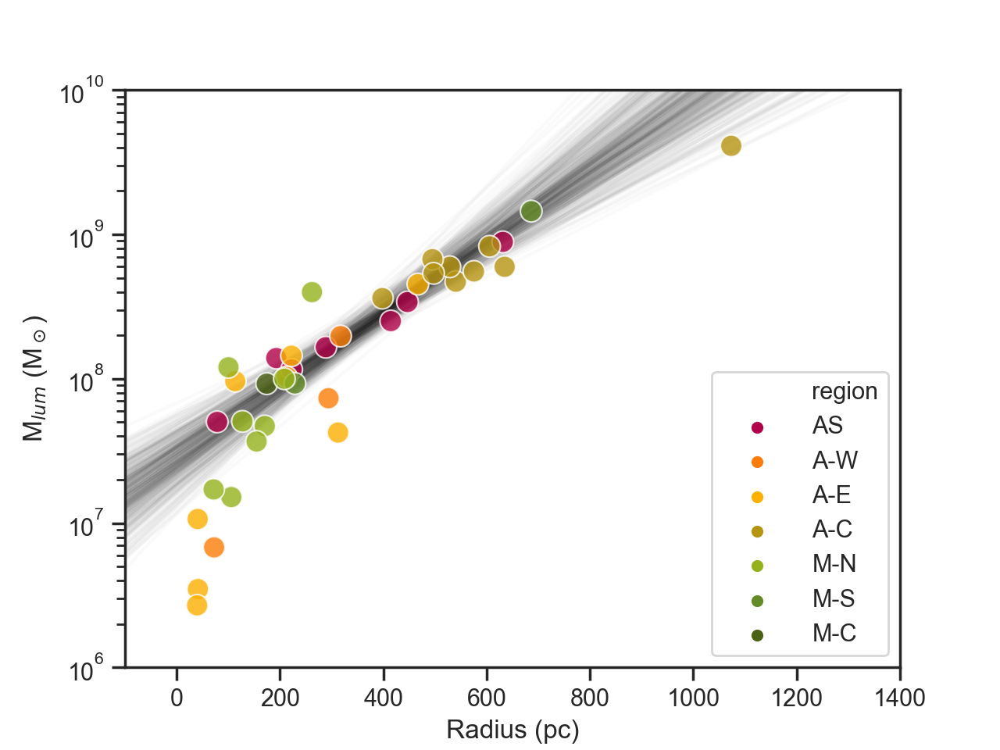

Linmix - Complete pooling: alpha = 7.45, beta = 0.002515, epsilon = 0.017770


In [33]:
lm = linmix.LinMix(data_x, data_y, uncertainty_x, uncertainty_y, K=2)
lm.run_mcmc(silent=True)

ax = plot_data()
for i in range(0, len(lm.chain), 25):
    xs = np.arange(-100,1400,100)
    ys = lm.chain[i]['alpha'] + xs * lm.chain[i]['beta']
    ax.plot(xs, 10**ys, color='k', alpha=0.02)

# print and save
complete_pooling['linmix'] = {'intercept':lm.chain['alpha'].mean(), 'slope':lm.chain['beta'].mean(),'epsilon':lm.chain['sigsqr'].mean()}
print('Linmix - Complete pooling: alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(lm.chain['alpha'].mean(),lm.chain['beta'].mean(),lm.chain['sigsqr'].mean()))

**TLS**

In [214]:
# Author: Jake VanderPlas
# License: BSD
#   The figure produced by this code is published in the textbook
#   "Statistics, Data Mining, and Machine Learning in Astronomy" (2013)
#   For more information, see http://astroML.github.com
#   To report a bug or issue, use the following forum:
#    https://groups.google.com/forum/#!forum/astroml-general
from scipy import optimize
from matplotlib.patches import Ellipse

from astroML.linear_model import TLS_logL
from astroML.plotting.mcmc import convert_to_stdev
from astroML.datasets import fetch_hogg2010test

#----------------------------------------------------------------------
# This function adjusts matplotlib settings for a uniform feel in the textbook.
# Note that with usetex=True, fonts are rendered with LaTeX.  This may
# result in an error if LaTeX is not installed on your system.  In that case,
# you can set usetex to False.
from astroML.plotting import setup_text_plots
setup_text_plots(fontsize=8, usetex=False)


#------------------------------------------------------------
# Define some convenience functions

# translate between typical slope-intercept representation,
# and the normal vector representation
def get_m_b(beta):
    b = np.dot(beta, beta) / beta[1]
    m = -beta[0] / beta[1]
    return m, b


def get_beta(m, b):
    denom = (1 + m * m)
    return np.array([-b * m / denom, b / denom])


# compute the ellipse pricipal axes and rotation from covariance
def get_principal(sigma_x, sigma_y, rho_xy):
    sigma_xy2 = rho_xy * sigma_x * sigma_y

    alpha = 0.5 * np.arctan2(2 * sigma_xy2, (sigma_x ** 2 - sigma_y ** 2))
    tmp1 = 0.5 * (sigma_x ** 2 + sigma_y ** 2)
    tmp2 = np.sqrt(0.25 * (sigma_x ** 2 - sigma_y ** 2) ** 2 + sigma_xy2 ** 2)

    return np.sqrt(tmp1 + tmp2), np.sqrt(tmp1 - tmp2), alpha


# plot ellipses
def plot_ellipses(x, y, sigma_x, sigma_y, rho_xy, factor=2, ax=None):
    if ax is None:
        ax = plt.gca()

    sigma1, sigma2, alpha = get_principal(sigma_x, sigma_y, rho_xy)

    for i in range(len(x)):
        ax.add_patch(Ellipse((x[i], y[i]), factor * sigma1[i], factor * sigma2[i], alpha[i] * 180. / np.pi, fc='none', ec='k'))

        
def fit_with_TSL(data_x,data_y,uncertainty_x,uncertainty_y):
    
    #------------------------------------------------------------
    # We'll use the data from table 1 of Hogg et al. 2010 -- ADAPTED THIS
    x = data_x.values
    y = data_y.values
    sigma_x = uncertainty_x
    sigma_y = uncertainty_y.values
    rho_xy = np.zeros_like(x)

    #------------------------------------------------------------
    # Find best-fit parameters
    X = np.vstack((x, y)).T
    dX = np.zeros((len(x), 2, 2))
    dX[:, 0, 0] = sigma_x ** 2
    dX[:, 1, 1] = sigma_y ** 2
    dX[:, 0, 1] = dX[:, 1, 0] = rho_xy * sigma_x * sigma_y

    min_func = lambda beta: -TLS_logL(beta, X, dX)
    beta_fit = optimize.fmin(min_func, x0=[-1, 1])

    #------------------------------------------------------------
    # Plot the data and fits
    fig = plt.figure(figsize=(10, 5))
    fig.subplots_adjust(left=0.1, right=0.95, wspace=0.25, bottom=0.15, top=0.9)

    #------------------------------------------------------------
    # first let's visualize the data
    ax = fig.add_subplot(121)
    ax.scatter(x, y, c='k', s=9)
    plot_ellipses(x, y, sigma_x, sigma_y, rho_xy, ax=ax)

    #------------------------------------------------------------
    # plot the best-fit line
    m_fit, b_fit = get_m_b(beta_fit)
    x_fit = np.arange(-100,1400,100) #np.linspace(0, 300, 10)
    ax.plot(x_fit, m_fit * x_fit + b_fit, 'red')

    ax.set_xlim(-100,1400)
    ax.set_ylim(4,12)
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y$')
    
    return m_fit,b_fit

Optimization terminated successfully.
         Current function value: 23.562485
         Iterations: 72
         Function evaluations: 137


<IPython.core.display.Javascript object>


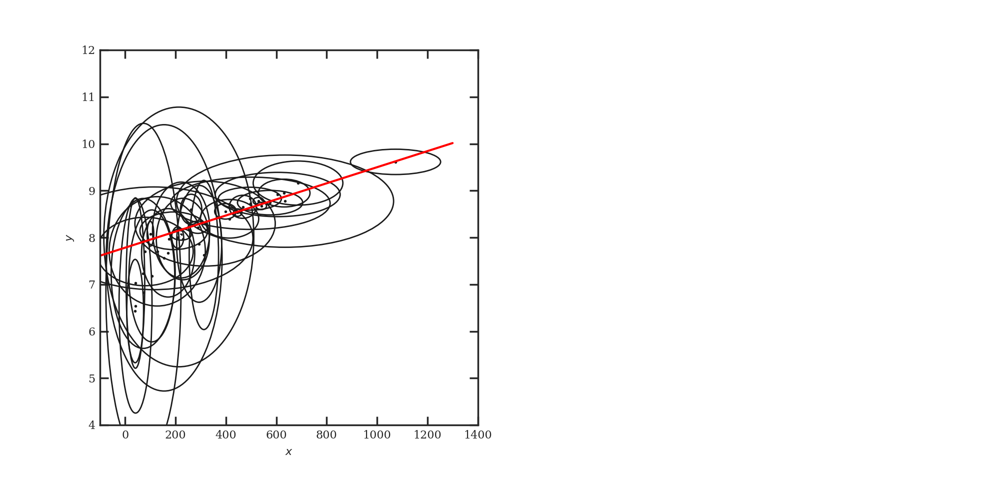

TLS - Complete pooling: alpha = 7.78, beta = 0.001716, epsilon = nan


In [215]:
m_fit, b_fit = fit_with_TSL(data_x,data_y,uncertainty_x,uncertainty_y)

## Print and save
complete_pooling['TLS'] = {'intercept':b_fit, slope:m_fit,'epsilon':np.nan}
print('TLS - Complete pooling: alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(b_fit,m_fit,np.nan))

**Pymc3**

In [184]:
def save_traces(name,trace,model):
    import pickle # python3

    with open(name+'.pkl', 'wb') as buff:
        pickle.dump({'model': model, 'trace': trace}, buff)

def load_traces(name):
    with open(name+'.pkl', 'rb') as buff:
        data = pickle.load(buff)  
    model, trace = data['model'], data['trace']
    return model, trace

In [147]:
# Complete pooling -- all together - no uncertainties
with pm.Model() as model:
    
    intercept = pm.Normal('intercept', 7, sd=2)
    gradient = pm.Normal('gradient', 0, sd=1)
    epsilon = pm.HalfCauchy('epsilon', 1)

    likelihood = pm.Normal('y', mu=intercept + gradient * data_x, sd=epsilon, observed=data_y)

    trace = pm.sample(3000,chains=5,tune=1500)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [epsilon, gradient, intercept]
Sampling 5 chains: 100%|██████████| 22500/22500 [00:31<00:00, 723.77draws/s] 
The acceptance probability does not match the target. It is 0.8887566448440485, but should be close to 0.8. Try to increase the number of tuning steps.


In [185]:
save_traces('complete_pooling_no_unc',trace,model)

In [148]:
with pm.Model() as model_with_studentT:
    
    intercept = pm.Normal('intercept', 7, sd=2)
    gradient = pm.Normal('gradient', 0, sd=1)
    epsilon = pm.HalfCauchy('epsilon', 1)
    nu = pm.Uniform('nu', lower=1, upper=100)

    likelihood = pm.StudentT('y', nu = nu, mu=intercept + gradient * data_x, sd=epsilon, observed=data_y)

    trace_with_studentT = pm.sample(3000,chains=5,tune=1500)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [nu, epsilon, gradient, intercept]
Sampling 5 chains: 100%|██████████| 22500/22500 [00:40<00:00, 552.69draws/s] 
The number of effective samples is smaller than 25% for some parameters.


In [186]:
save_traces('complete_pooling_no_unc_studentT',trace_with_studentT,model_with_studentT)

In [149]:
# Complete pooling -- all together - with uncertainties
with pm.Model() as model_with_unc:
    
    intercept = pm.Normal('intercept', 7, sd=2)
    gradient = pm.Normal('gradient', 0, sd=1)
    epsilon = pm.HalfCauchy('epsilon', 1)

    # depends on your prior knowledge of true_x
    true_x = pm.Normal('true_x', mu=np.mean(data_x), sd=np.std(data_x), shape=len(data_x)) 
    likelihood_x = pm.Normal('x', mu=true_x, sd=uncertainty_x, observed=data_x)
    
    true_y = pm.Normal('true_y', mu = intercept + gradient * true_x, sd=epsilon, shape=len(data_x))
    likelihood_y = pm.Normal('y', mu=true_y, sd=uncertainty_y, observed=data_y)
    
    trace_with_unc = pm.sample(4000,chains=5,tune=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [true_y, true_x, epsilon, gradient, intercept]
Sampling 5 chains: 100%|██████████| 30000/30000 [05:19<00:00, 94.00draws/s] 
There were 783 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6539927431594954, but should be close to 0.8. Try to increase the number of tuning steps.
There were 358 divergences after tuning. Increase `target_accept` or reparameterize.
There were 607 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6548858398179431, but should be close to 0.8. Try to increase the number of tuning steps.
There were 388 divergences after tuning. Increase `target_accept` or reparameterize.
There were 1565 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probab

In [188]:
save_traces('complete_pooling_with_unc',trace_with_unc,model_with_unc)

In [150]:
# Complete pooling -- all together - with uncertainties and studentT
with pm.Model() as mode_with_unc_and_T:
    
    intercept = pm.Normal('intercept', 7, sd=2)
    gradient = pm.Normal('gradient', 0, sd=1)
    epsilon = pm.HalfCauchy('epsilon', 1)

    # depends on your prior knowledge of true_x
    true_x = pm.Normal('true_x', mu=np.mean(data_x), sd=np.std(data_x), shape=len(data_x)) 
    likelihood_x = pm.Normal('x', mu=true_x, sd=uncertainty_x, observed=data_x)
    
    true_y = pm.Normal('true_y', mu = intercept + gradient * true_x, sd=epsilon, shape=len(data_x))    
    # To account for outliers
    nu = pm.Uniform('nu', lower=1, upper=100)
    likelihood_y = pm.StudentT('y', nu=nu, mu=true_y, sigma=uncertainty_y, observed=data_y)
    
    trace_with_unc_and_T = pm.sample(4000,chains=5,tune=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [nu, true_y, true_x, epsilon, gradient, intercept]
Sampling 5 chains: 100%|██████████| 30000/30000 [06:38<00:00, 75.33draws/s] 
There were 1608 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.4807580955714606, but should be close to 0.8. Try to increase the number of tuning steps.
There were 1266 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6013582641288473, but should be close to 0.8. Try to increase the number of tuning steps.
There were 246 divergences after tuning. Increase `target_accept` or reparameterize.
There were 930 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.5675878716512359, but should be close t

In [189]:
save_traces('complete_pooling_with_unc_and_studentT',trace_with_unc_and_T,mode_with_unc_and_T)

Plot

In [ ]:
def print_results(trace,ax,color='k',Print=True):
    try:
        mean_intercept = trace.get_values('intercept').mean()
        mean_gradient = trace.get_values('gradient').mean()
    except KeyError:
        mean_intercept = trace.get_values('mu_a').mean()
        mean_gradient = trace.get_values('mu_b').mean()
    ax.plot(xs, 10**(mean_intercept + mean_gradient*xs), color=color, alpha=1, label='Normal likelihood',linewidth=2,linestyle=':') 
    if Print:
        print('alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(mean_intercept,mean_gradient,trace.get_values('epsilon').mean()))

<IPython.core.display.Javascript object>


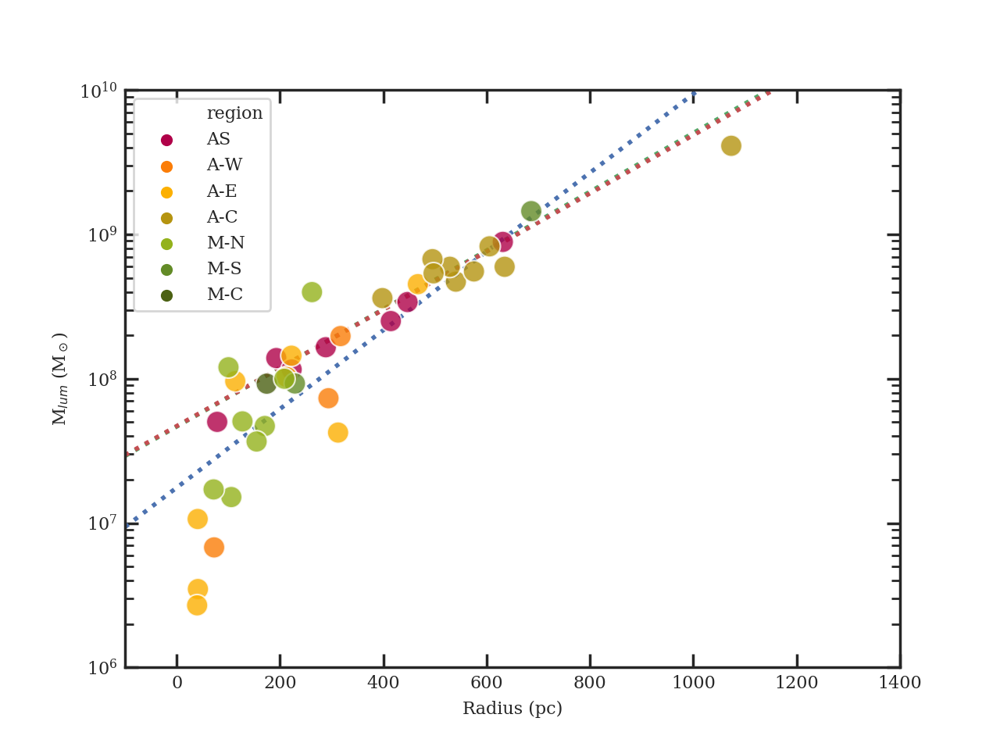

alpha = 7.25, beta = 0.002727, epsilon = 0.360623
alpha = 7.67, beta = 0.002034, epsilon = 0.069039
alpha = 7.67, beta = 0.002015, epsilon = 0.064513


In [221]:
ax = plot_data()

print_results(trace,ax,color='C0')
print_results(trace_with_unc,ax,color='C2')
print_results(trace_with_unc_and_T,ax,color='C3')

### No-polling (all galaxies separatly)

**Linmix**

(the fit with pymc3 should be quite similar)

<IPython.core.display.Javascript object>


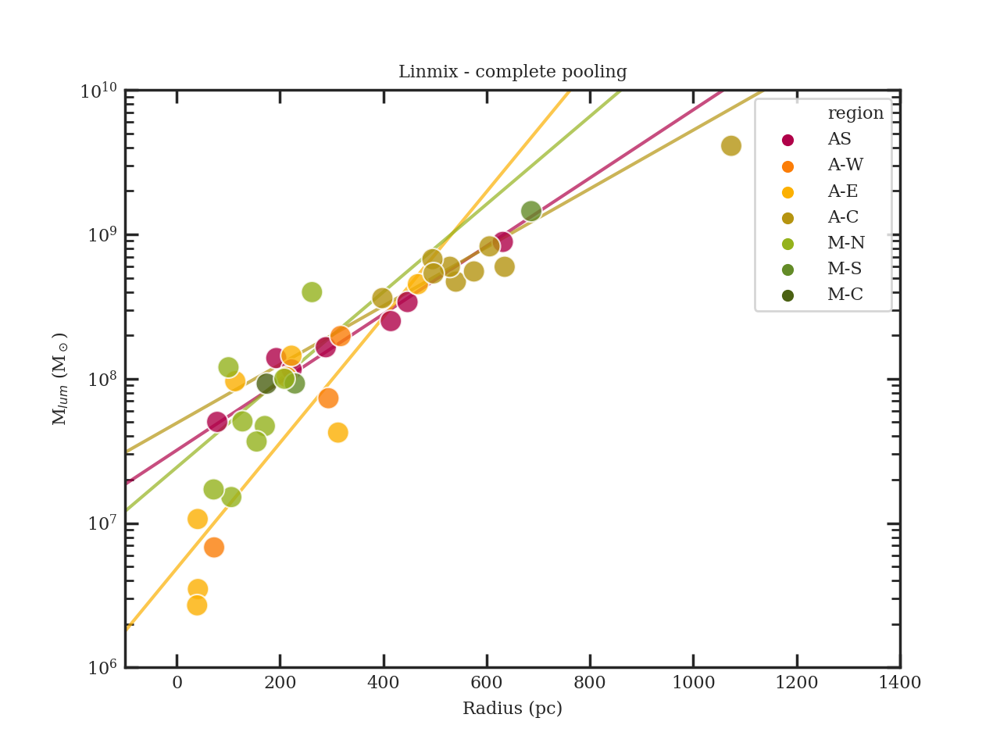

Linmix - AS: alpha = 7.50, beta = 0.002358, epsilon = 0.219944
Linmix - A-E: alpha = 6.69, beta = 0.004349, epsilon = 0.663449
Linmix - A-C: alpha = 7.69, beta = 0.002030, epsilon = 0.042474
Linmix - M-N: alpha = 7.39, beta = 0.003040, epsilon = 0.601514


In [222]:
ax = plot_data()

# No pooling - each galaxy individuall
ax.set_title('Linmix - complete pooling')

for n,reg in enumerate(['AS','A-W', 'A-E', 'A-C', 'M-N', 'M-S', 'M-C']):

        if (reg == 'A-W') or (reg == 'M-S') or (reg == 'M-C'):
            continue
        x_var = 'radius_pc'
        y_var = 'Mass_mol'
        
        # Select subset of data belonging to each region
        select = np.nan
        select = data.ix[data.region == reg]
        y_data = np.array(select[y_var])
        x_data = np.array(select[x_var])
        x_uncertainty = np.array(np.mean((select[x_var+'_uerr'],select[x_var+'_lerr']),axis=0))
        y_uncertainty = np.array(np.mean((select[y_var+'_uerr'],select[y_var+'_lerr']),axis=0))*0.3
 
        # logify
        y_uncertainty = y_uncertainty/y_data
        y_data = np.log10(y_data)
        
        # Fit and plot
        lm = linmix.LinMix(x_data, y_data, x_uncertainty, y_uncertainty, K=2)
        try:
            lm.run_mcmc(silent=True)     
        except ValueError:
            print('Not good ',reg)
            pass
        
        xs = np.arange(-100,1400,100)
        mean_alpha = np.mean(lm.chain['alpha'])
        mean_beta  = np.mean(lm.chain['beta'])
        ax.plot(xs, 10**(mean_alpha + mean_beta*xs), color=cmap[n], alpha=0.7)
        
        print('Linmix - %s: alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(reg,lm.chain['alpha'].mean(),lm.chain['beta'].mean(),lm.chain['sigsqr'].mean()))


**Sumary of complete pooling**

| name                     | slope    | intercept | epsilon  |
|--------------------------|----------|-----------|----------|
| linmix                   | 0.002010 | 7.68      | 0.010990 |
| TLS                      | 0.001716 | 7.78      | --       |
| pymc3                    | 0.002034 | 7.67      | 0.069039 |
| pymc3 (no uncertainties) | 0.002727 | 7.25      | 0.360623 |
| pymc3 (with StudentT)    | 0.002015 | 7.67      | 0.064513 |


**Sumary of no-pooling**

| name                     | slope    | intercept | epsilon  |
|--------------------------|----------|-----------|----------|
| AS     | 0.002358 | 7.50      | 0.219944 |
| A-E    | 0.004349 | 6.69      | 0.663449 |
| A-C    | 0.002030 | 7.69      | 0.042474 |
| M-N    | 0.003040 | 7.39      | 0.601514 |


## Hierarchical 

In [153]:
# Hierarchical -- no uncertainties
with pm.Model() as hierarchical_model:
    
    # Hyperpriors for group nodes
    mu_a = pm.Normal('mu_a', mu=7., sigma=10)
    sigma_a = pm.HalfNormal('sigma_a', 5.)
    mu_b = pm.Normal('mu_b', mu=1., sigma=1)
    sigma_b = pm.HalfNormal('sigma_b', 5.)

    # Intercept for each county, distributed around group mean mu_a
    # Above we just set mu and sd to a fixed value while here we
    # plug in a common group distribution for all a and b (which are
    # vectors of length names).
    a = pm.Normal('a', mu=mu_a, sigma=sigma_a, shape=len(names))
    # Intercept for each county, distributed around group mean mu_a
    b = pm.Normal('b', mu=mu_b, sigma=sigma_b, shape=len(names))

    # Model error
    epsilon = pm.HalfCauchy('epsilon', 1.)

    y = a[reg_id_numerical] + b[reg_id_numerical]*data_x

    # Data likelihood
    likelihood = pm.Normal('likelihood', mu=y, sigma=epsilon, observed=data_y)
    
    trace_hierarchical = pm.sample(4000,chains=5,tune=2000,cores=2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 2 jobs)
NUTS: [epsilon, b, a, sigma_b, mu_b, sigma_a, mu_a]
Sampling 5 chains: 100%|██████████| 30000/30000 [02:47<00:00, 178.62draws/s]
There were 533 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6591232749771778, but should be close to 0.8. Try to increase the number of tuning steps.
There were 265 divergences after tuning. Increase `target_accept` or reparameterize.
There were 241 divergences after tuning. Increase `target_accept` or reparameterize.
There were 518 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.7006233947094556, but should be close to 0.8. Try to increase the number of tuning steps.
There were 677 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probabil

In [190]:
save_traces('hierarchical',trace_hierarchical, hierarchical_model)

In [254]:
with pm.Model() as hierarchical_model_with_uncertainties:
    
    # Hyperpriors for group nodes
    mu_a = pm.Normal('mu_a', mu=7.5, sigma=0.5)
    sigma_a = pm.HalfNormal('sigma_a', 1.)
    mu_b = pm.Normal('mu_b', mu=0., sigma=0.01)
    sigma_b = pm.HalfNormal('sigma_b', 0.1)

    # Intercept for each galaxy, distributed around group mean mu_a
    # Above we just set mu and sd to a fixed value while here we
    # plug in a common group distribution for all a and b (which are
    # vectors of length names).
    a = pm.Normal('a', mu=mu_a, sigma=sigma_a, shape=len(names))
    # Intercept for each county, distributed around group mean mu_a
    b = pm.Normal('b', mu=mu_b, sigma=sigma_b, shape=len(names))

    # Model error
    epsilon = pm.HalfCauchy('epsilon', 1)

    ### WHAT WORKS
    #y = a[reg_id_numerical] + b[reg_id_numerical]*data_x
    #likelihood = pm.Normal('likelihood', mu=y, sigma=epsilon, observed=data_y)
    
    # Model data
    true_x = pm.Normal('true_x', mu=np.mean(data_x), sd=np.std(data_x), shape=len(data_x)) 
    likelihood_x = pm.Normal('x', mu=true_x, sd=uncertainty_x, observed=data_x, shape=len(names))
    
    true_y = pm.Normal('true_y', mu = a[reg_id_numerical] + b[reg_id_numerical] * true_x, sd=epsilon, shape=len(data_y))    
    likelihood_y = pm.Normal('y',mu=true_y, sigma=uncertainty_y, observed=data_y, shape=len(names))
    
    trace_hierarchical_with_unc = pm.sample(4000,chains=10,tune=500,cores=3)

<IPython.core.display.Javascript object>


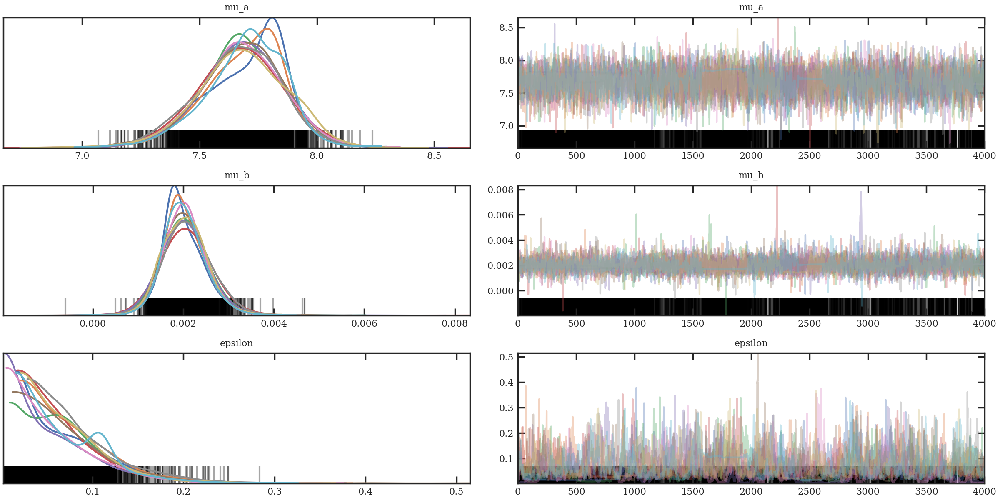

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x12fb91710>,
      dtype=object)

In [249]:
pm.traceplot(trace_hierarchical_with_unc,['mu_a','mu_b','epsilon'])

In [250]:
save_traces('hierarchical_with_unc',trace_hierarchical_with_unc, hierarchical_model_with_uncertainties)

Plotting

<IPython.core.display.Javascript object>


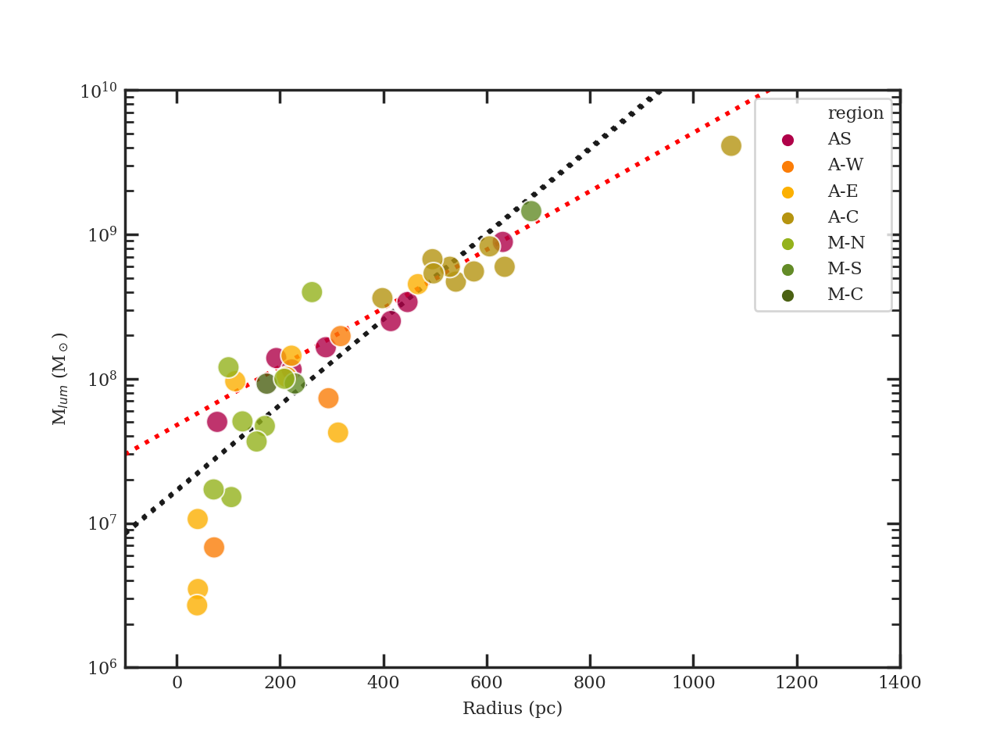

alpha = 7.22, beta = 0.002973, epsilon = 0.341685
alpha = 7.23, beta = 0.002949, epsilon = 0.328036
alpha = 7.68, beta = 0.002025, epsilon = 0.067247


In [252]:
ax = plot_data()

print_results(trace_hierarchical,ax,color='k')
print_results(trace_hierarchical_studentT,ax,color='k')
print_results(trace_hierarchical_with_unc,ax,color='red')

<IPython.core.display.Javascript object>


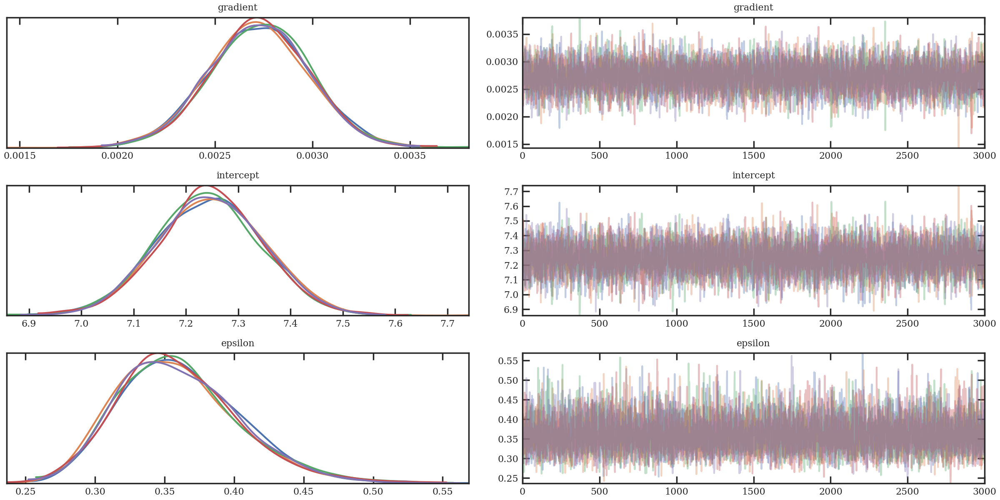

<IPython.core.display.Javascript object>


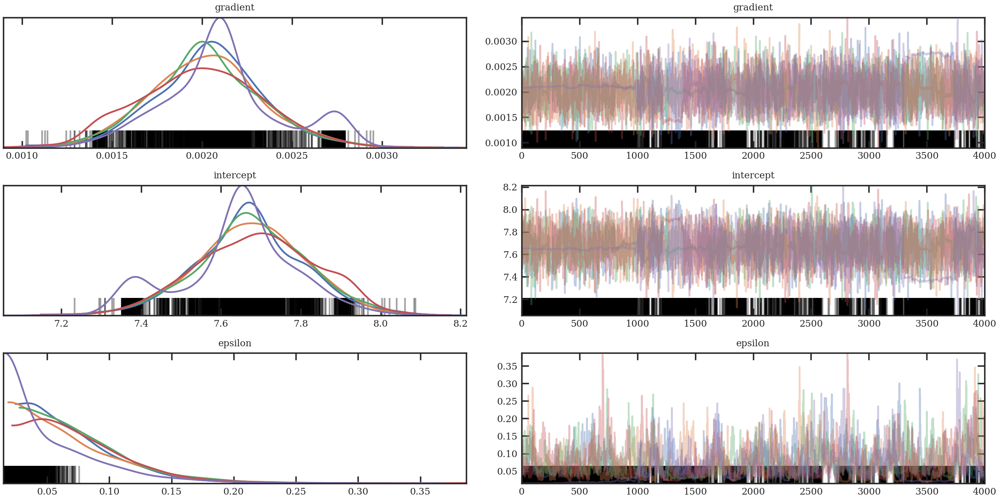

<IPython.core.display.Javascript object>


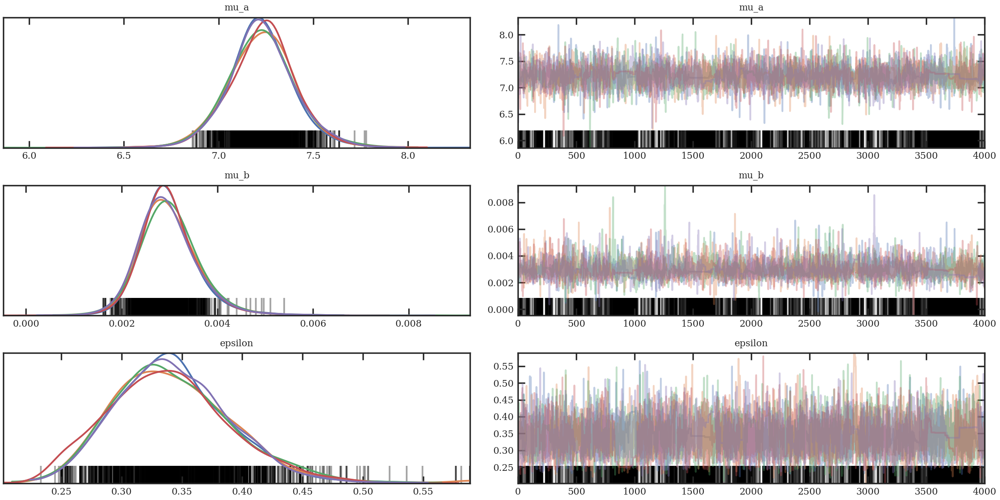

<IPython.core.display.Javascript object>


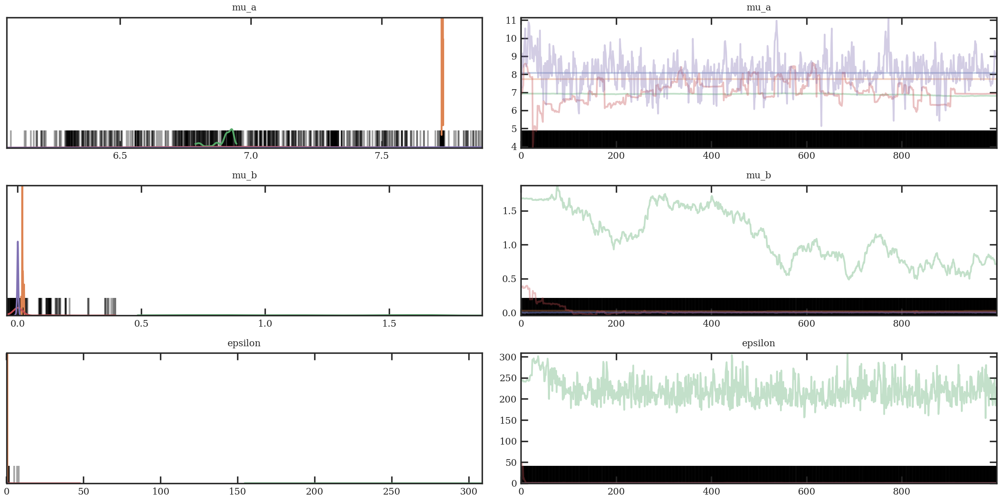

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x13481c0b8>,
      dtype=object)

In [225]:
## Trace plots
pm.traceplot(trace,['gradient','intercept','epsilon'])
pm.traceplot(trace_with_unc,['gradient','intercept','epsilon'])
pm.traceplot(trace_hierarchical,['mu_a','mu_b','epsilon'])
pm.traceplot(trace_hierarchical_with_unc,['mu_a','mu_b','epsilon'])

sigma vs size

<IPython.core.display.Javascript object>


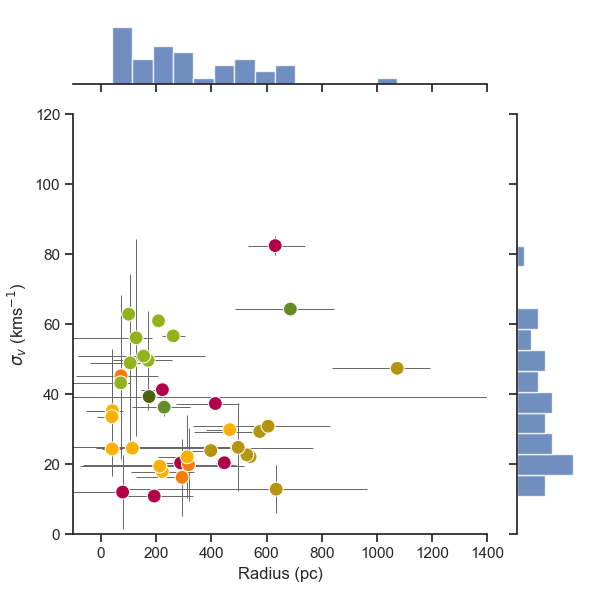

Text(34.875, 0.5, '$\\sigma_v$ (kms$^{-1}$)')

In [9]:
sns.set(style="ticks", color_codes=True)

# Global plot
g = sns.JointGrid("radius_pc", "line_width", data=all_data, space=0.5)

## Main plot
g = g.plot_joint(plt.scatter, color="#005f6a")

# per region
sns.scatterplot('radius_pc','line_width',data=all_data, hue='region',
                palette=cmap,zorder=10,s=100, ax = g.ax_joint, legend=False)

# error bars
for d in all_data.groupby('region'):
    data = d[1]
    g.ax_joint.errorbar(x=data['radius_pc'],y=data['line_width'],
                        xerr=[data['radius_pc_lerr'],data['radius_pc_uerr']],yerr=data['line_width_unc'],
                        ecolor='0.4',elinewidth=0.7,linestyle='')

## Marginals
_ = g.ax_marg_y.hist(np.array(all_data['line_width'].values),orientation="horizontal", bins=12, alpha=0.8)
_ = g.ax_marg_x.hist(np.array(all_data['radius_pc'].values), bins=14,alpha=0.8)
 
# Axes
g.ax_joint.set_xlim(-100,1400)
g.ax_joint.set_ylim(0,120)
g.ax_joint.set_xlabel('Radius (pc)')
g.ax_joint.set_ylabel('$\sigma_v$ (kms$^{-1}$)')

In [ ]:
sigma vs mass

<IPython.core.display.Javascript object>


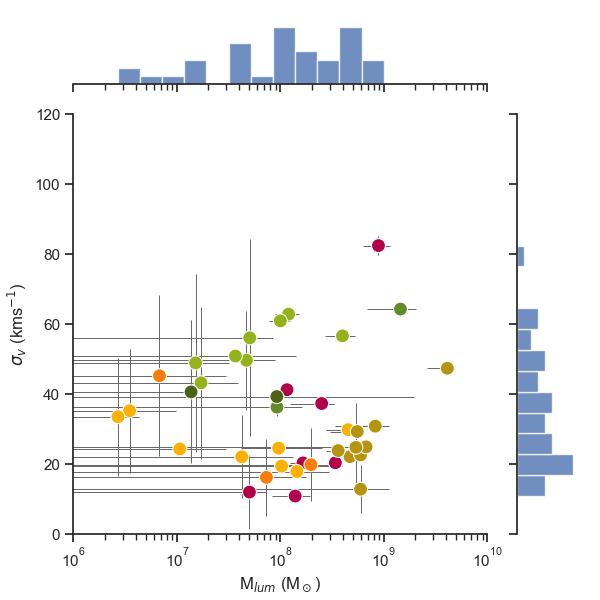

Text(34.875, 0.5, '$\\sigma_v$ (kms$^{-1}$)')

In [10]:
sns.set(style="ticks", color_codes=True)

# Global plot
g = sns.JointGrid("Mass_mol", "line_width", data=all_data, space=0.5)

## Main plot
g = g.plot_joint(plt.scatter, color="#005f6a")

# per region
sns.scatterplot('Mass_mol','line_width',data=all_data, hue='region',
                palette=cmap,zorder=10,s=100, ax = g.ax_joint, legend=False)

# error bars
for d in all_data.groupby('region'):
    data = d[1]
    g.ax_joint.errorbar(x=data['Mass_mol'],y=data['line_width'],
                        xerr=[data['Mass_mol_lerr'],data['Mass_mol_uerr']],yerr=data['line_width_unc'],
                        ecolor='0.4',elinewidth=0.7,linestyle='')

## Marginals
_ = g.ax_marg_y.hist(np.array(all_data['line_width'].values),orientation="horizontal", bins=12, alpha=0.8)
_ = g.ax_marg_x.hist(np.array(all_data['Mass_mol'].values),alpha=0.8,bins=np.logspace(6,9,15))
 
# Axes
g.ax_joint.set_xscale('log')
g.ax_joint.set_xlim(1e6,1e10)
g.ax_joint.set_ylim(0,120)
g.ax_joint.set_xlabel('M$_{lum}$ (M$_\odot$)')
g.ax_joint.set_ylabel('$\sigma_v$ (kms$^{-1}$)')

### Are clumps virialised?

In [195]:
colours =['#ffad01','#f97306','#e50000','#c20078', '#80013f','#01386a','#047495','#1fa774', '#3f9b0b']

as1063_color = colours[3]
a521_color = colours[0]
m1206_color = colours[6]

a521_pallete = colours[0:3]
m1206_pallete = colours[5:8]

<IPython.core.display.Javascript object>


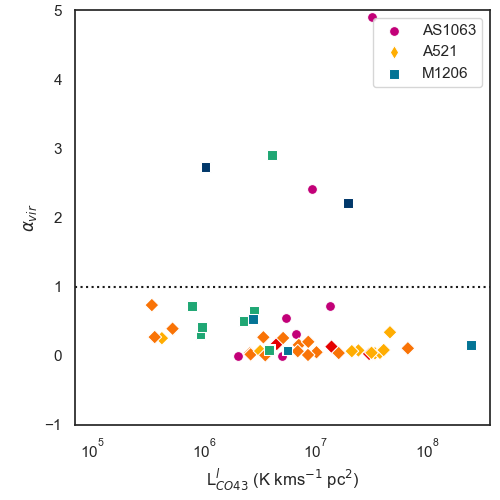

In [286]:
sns.set_style('white')
fig, ax = plt.subplots(1,1,figsize=(5,5))
fig.subplots_adjust(top=0.98,bottom=0.15,right=0.98,left=0.15)

xaxis = 'Ll_CO43'
sns.scatterplot(xaxis,'vir_param',data=as1063,marker='o',label='AS1063',s=50,color=as1063_color)
sns.scatterplot(xaxis,'vir_param',data=a521,marker='d',label='A521',s=50,color=a521_color)
sns.scatterplot(xaxis,'vir_param',data=m1206,marker='s',label='M1206',s=50,color=m1206_color)
sns.scatterplot(xaxis,'vir_param',data=a521,hue='mlt_region',marker='D',label='A521',s=50,palette=a521_pallete,legend=None)
sns.scatterplot(xaxis,'vir_param',data=m1206,hue='mlt_region',marker='s',label='M1206',s=50,palette=m1206_pallete,legend=None)

#ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylim(-1,5)
ax.axhline(1,linestyle=':',color='k')
ax.set_ylabel('$\\alpha_{vir}$')
ax.set_xlabel('L$^l_{CO43}$ (K kms$^{-1}$ pc$^2$)')
fig.savefig('../Plots/virialisation.jpeg')

### Lars scaling relations

In [185]:
def plot(xaxis,yaxis,ax,log=False):
    sns.scatterplot(xaxis,yaxis,data=as1063,marker='o',label='AS1063',s=50,color=as1063_color,ax=ax)
    sns.scatterplot(xaxis,yaxis,data=a521,marker='d',label='A521',s=50,color=a521_color,ax=ax)
    sns.scatterplot(xaxis,yaxis,data=m1206,marker='s',label='M1206',s=50,color=m1206_color,ax=ax)
    sns.scatterplot(xaxis,yaxis,data=a521,hue='mlt_region',marker='D',label='A521',s=50,palette=a521_pallete,legend=None,ax=ax)
    sns.scatterplot(xaxis,yaxis,data=m1206,hue='mlt_region',marker='s',label='M1206',s=50,palette=m1206_pallete,legend=None,ax=ax)
    if log:
        ax.set(xscale="log", yscale="log")

<IPython.core.display.Javascript object>


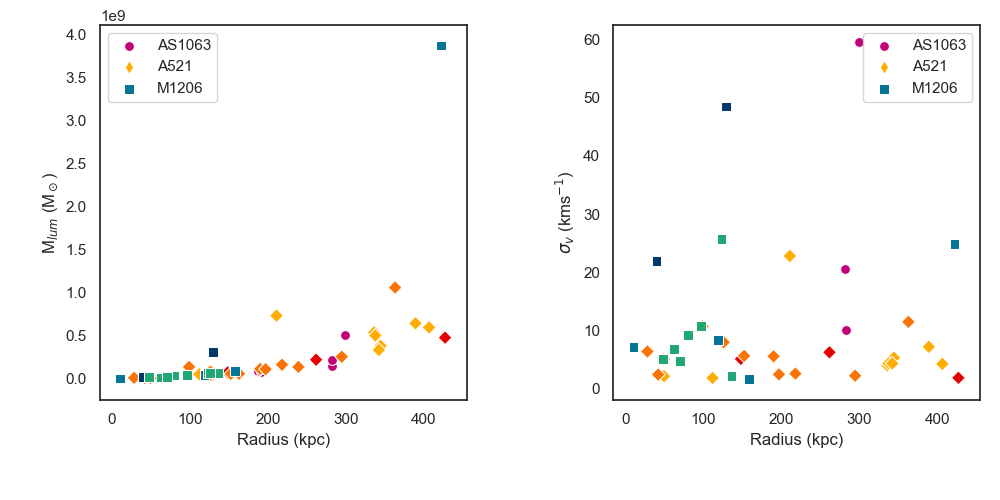

In [287]:
sns.set_style('white')
fig, ax = plt.subplots(1,2,figsize=(10,5))
fig.subplots_adjust(top=0.95,bottom=0.2,right=0.98,left=0.1,wspace=0.4)

plot('radius_pc','Mass_mol',ax[0],log=False)
ax[0].set_xlabel('Radius (kpc)')
ax[0].set_ylabel('M$_{lum}$ (M$_\odot$)')
#ax[0].set_xlim(1,10**(3))

plot('radius_pc','v_sigma',ax[1],log=False)
ax[1].set_xlabel('Radius (kpc)')
ax[1].set_ylabel('$\sigma_v$ (kms$^{-1}$)')
#ax[1].set_xlim(1,10**(3))

fig.savefig('../Plots/Lars_scaling.jpeg')

## Alpha CO

<IPython.core.display.Javascript object>


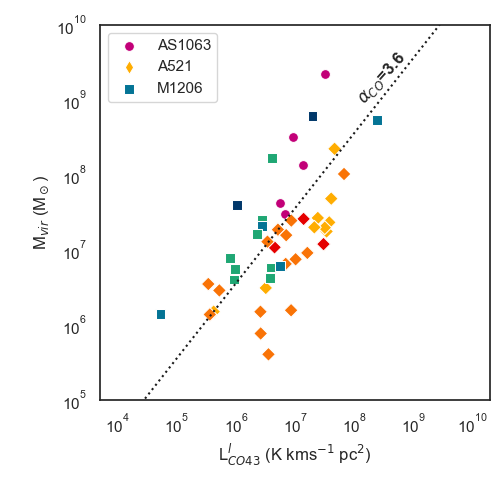

In [288]:
sns.set_style('white')
fig, ax = plt.subplots(1,1,figsize=(5,5))
fig.subplots_adjust(top=0.95,bottom=0.2,right=0.98,left=0.2)

plot('Ll_CO43','Mass_vir',ax,log=True)
ax.set_xlabel('L$^{l}_{CO43}$ (K kms$^{-1}$ pc$^2$)')
ax.set_ylabel('M$_{vir}$ (M$_\odot$)')
ax.set_ylim(10**5,10**10)
ax.plot(np.logspace(4,10),3.6*np.logspace(4,10),color='k',linestyle=':')
ax.annotate('$\\alpha_{CO}$=3.6',xy=(10**8,10**9.5),rotation=48,fontweight='bold')

fig.savefig('../Plots/alpha_CO43.jpeg')

<IPython.core.display.Javascript object>


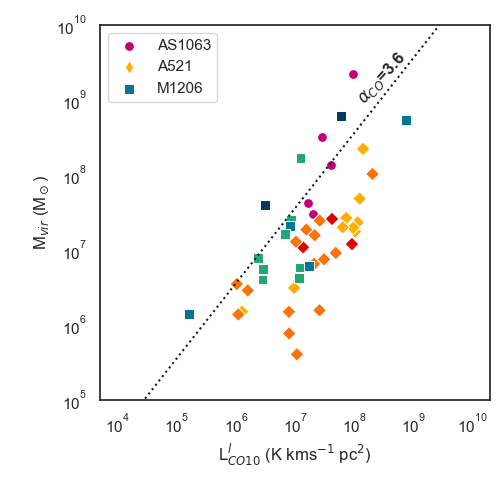

In [289]:
sns.set_style('white')
fig, ax = plt.subplots(1,1,figsize=(5,5))
fig.subplots_adjust(top=0.95,bottom=0.2,right=0.98,left=0.2)

plot('Ll_CO10','Mass_vir',ax,log=True)
ax.set_xlabel('L$^{l}_{CO10}$ (K kms$^{-1}$ pc$^2$)')
ax.set_ylabel('M$_{vir}$ (M$_\odot$)')
ax.set_ylim(10**5,10**10)
ax.plot(np.logspace(4,10),3.6*np.logspace(4,10),color='k',linestyle=':')
ax.annotate('$\\alpha_{CO}$=3.6',xy=(10**8,10**9.5),rotation=48,fontweight='bold')
fig.savefig('../Plots/alpha_CO10.jpeg')

## Kennicutt-Schmidt

<IPython.core.display.Javascript object>


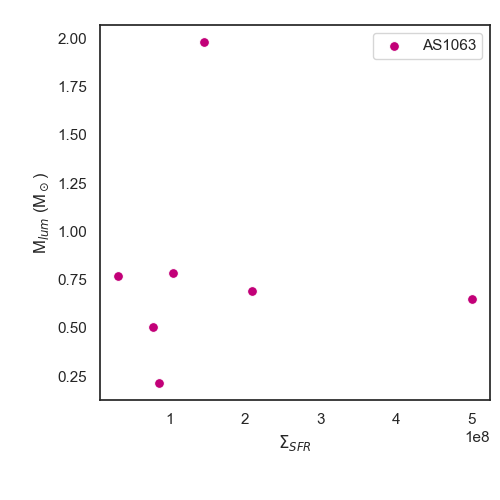

Text(0, 0.5, 'M$_{lum}$ (M$_\\odot$)')

In [232]:
sns.set_style('white')
fig, ax = plt.subplots(1,1,figsize=(5,5))
fig.subplots_adjust(top=0.95,bottom=0.2,right=0.98,left=0.2)

sns.scatterplot('Mass_mol','sfr_exact',data=as1063,marker='o',label='AS1063',s=50,color=as1063_color,ax=ax)
ax.set_xlabel('$\Sigma_{SFR}$')
ax.set_ylabel('M$_{lum}$ (M$_\odot$)')
#ax.set_ylim(10**5,10**10)

## Mass comparision

<IPython.core.display.Javascript object>


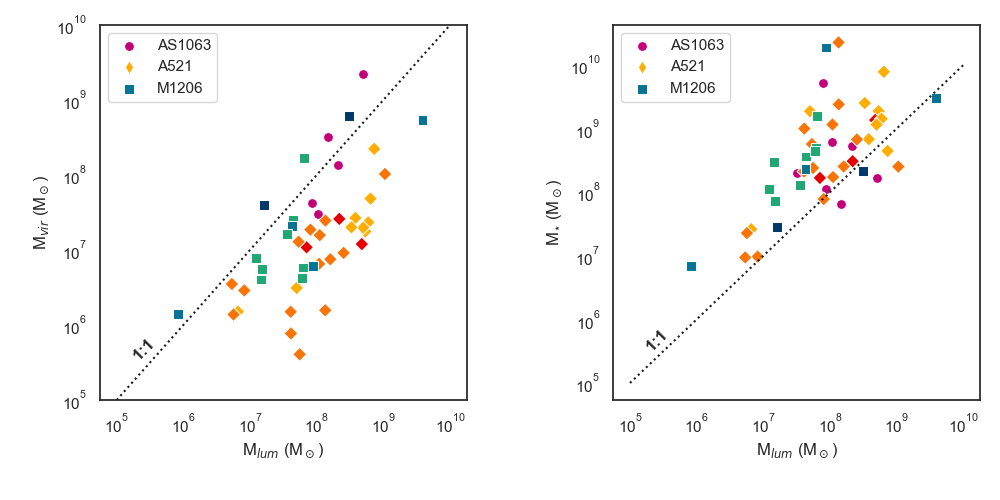

In [290]:
sns.set_style('white')
fig, ax = plt.subplots(1,2,figsize=(10,5))
fig.subplots_adjust(top=0.95,bottom=0.2,right=0.98,left=0.1,wspace=0.4)
plot('Mass_mol','Mass_vir',ax[0],log=True)
ax[0].set_ylabel('M$_{vir}$ (M$_\odot$)')
ax[0].set_xlabel('M$_{lum}$ (M$_\odot$)')
ax[0].set_ylim(10**5,10**10)
ax[0].plot(np.logspace(5,10),np.logspace(5,10),color='k',linestyle=':')
ax[0].annotate('1:1',xy=(10**5.2,10**5.7),rotation=45,fontweight='bold')

plot('Mass_mol','Mass_stellar',ax[1],log=True)
ax[1].set_xlabel('M$_{lum}$ (M$_\odot$)')
ax[1].set_ylabel('M$_{\star}$ (M$_\odot$)')
ax[1].plot(np.logspace(5,10),np.logspace(5,10),color='k',linestyle=':')
ax[1].annotate('1:1',xy=(10**5.2,10**5.7),rotation=45,fontweight='bold')

fig.savefig('../Plots/masses.jpeg')